# Predictive Analysis of Hepatitis Mortality

## Author: [Michael Holdbrooke](mickybroox@gmail.com)

### Date: 20th April, 2021

![AddictivePtyhon](src/AddictivePython.png)

### Load Packages

In [1]:
# %%writefile train.py

# Load the iconic trio 🔥
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Set plot style
plt.style.use('fivethirtyeight')

# Import seaborn for style and beauty
import seaborn as sns

# Set context 
sns.set_context('paper')

# Import model_selection to get access to some dope functions like GridSearchCV()
from sklearn import model_selection

# Import StandardScaler for data normalization
from sklearn.preprocessing import StandardScaler

# Import SMOTE to handle imbalance classes
from imblearn.over_sampling import SVMSMOTE

# Load algorithms
from sklearn import tree
from sklearn import ensemble
import xgboost
from sklearn import linear_model

# custom
from custom import helper

# Load evaluation metrics
from sklearn import metrics

# Import pickle for model serialization
import pickle

# Import feature selection functions
from sklearn.feature_selection import SelectKBest, RFE, chi2

# Import lime for model interpretation
import lime
import lime.lime_tabular

import tensorflow as tf

import time

# Set Seed
np.random.seed(81)
tf.random.set_seed(81)

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


### Style Tables

In [2]:
%%HTML
<style type='text/css'>
table.dataframe th, table.dataframe td{
    border: 6px solid purple !important;
    color: solid black !important;
}
</style>

### Modify the number of Columns to Display

In [3]:
pd.options.display.max_columns = None

### Load Data

In [4]:
clean_data = pd.read_csv("data/cleaned_data.csv")
clean_data.head()

,class,age,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,1,50,0,1,0,1,1,0,1,1,1,1,1,0.9,135,42,3.5,61,0
1,1,78,1,1,0,1,1,1,1,1,1,1,1,0.7,96,32,4.0,61,0
2,1,31,1,0,1,1,1,1,1,1,1,1,1,0.7,46,52,4.0,80,0
3,1,34,1,1,1,1,1,1,1,1,1,1,1,1.0,85,200,4.0,61,0
4,1,34,1,1,1,1,1,1,1,1,1,1,1,0.9,95,28,4.0,75,0


### Create a Copy of the Loaded Data

In [5]:
data_with_targets = clean_data.copy()
data_with_targets.head()

,class,age,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,1,50,0,1,0,1,1,0,1,1,1,1,1,0.9,135,42,3.5,61,0
1,1,78,1,1,0,1,1,1,1,1,1,1,1,0.7,96,32,4.0,61,0
2,1,31,1,0,1,1,1,1,1,1,1,1,1,0.7,46,52,4.0,80,0
3,1,34,1,1,1,1,1,1,1,1,1,1,1,1.0,85,200,4.0,61,0
4,1,34,1,1,1,1,1,1,1,1,1,1,1,0.9,95,28,4.0,75,0


---

## Data Preprocessing

---

### Split the Data into Feature Matrix and Target Label

In [6]:
target_variable = 'class'

# Unscaled Features
X = data_with_targets.drop([target_variable], axis=1)

# Target Variable
y = data_with_targets[target_variable]

In [7]:
len(X), len(y)

(154, 154)

### `SMOTE` Sampling to deal with imbalance classes

In [8]:
# Set Seed Value
seed = 81

smote = SVMSMOTE(random_state=seed)

resampled_X, resampled_y = smote.fit_resample(X, y)

In [9]:
# Save Resampled Data
resampled_X.to_csv('data/resampled_future_matrix.csv', index=False) 

resampled_y.to_csv('data/resampled_target_label.csv', index=False)

In [10]:
len(resampled_X), len(resampled_y)

(198, 198)

In [11]:
resampled_X.head()

,age,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,50,0,1,0,1,1,0,1,1,1,1,1,0.9,135,42,3.5,61,0
1,78,1,1,0,1,1,1,1,1,1,1,1,0.7,96,32,4.0,61,0
2,31,1,0,1,1,1,1,1,1,1,1,1,0.7,46,52,4.0,80,0
3,34,1,1,1,1,1,1,1,1,1,1,1,1.0,85,200,4.0,61,0
4,34,1,1,1,1,1,1,1,1,1,1,1,0.9,95,28,4.0,75,0


### Feature Selection

#### Using `SelectKBest()`

In [12]:
select_k_best = SelectKBest(score_func=chi2, k=10)

best_features = select_k_best.fit(resampled_X, resampled_y)

In [13]:
best_features_values = best_features.transform(resampled_X)

In [14]:
# Get Scores
feature_scores = pd.DataFrame(best_features.scores_, columns=['feature_scores'])

# Get Features
feature_column_names = pd.DataFrame(resampled_X.columns, columns=['feature_name'])

# Add Scores and Features into a single DataFrame
best_features_df = pd.concat([feature_scores, feature_column_names], axis=1)

# Save DataFrame
best_features_df.to_csv("csv_tables/feature_scores_using_selectkbest.csv", index=True)
best_features_df

,feature_scores,feature_name
0,47.678838,age
1,9.650305,steroid
2,0.560575,antivirals
3,26.843701,fatigue
4,25.596190,malaise
5,2.919487,anorexia
6,0.008300,liver_big
7,2.798425,liver_firm
8,10.246643,spleen_palpable
9,25.897697,spiders


#### `SelectKBest` Top 10 Features

In [15]:
best_ten_features_using_selectkbest = best_features_df.nlargest(10,'feature_scores')
best_ten_features_using_selectkbest

,feature_scores,feature_name
16,175.666538,protime
13,74.778430,alk_phosphate
14,63.775242,sgot
0,47.678838,age
12,41.760055,bilirubin
3,26.843701,fatigue
9,25.897697,spiders
4,25.596190,malaise
10,13.887153,ascites
8,10.246643,spleen_palpable


#### Get Names of Top 10 Features

In [16]:
top_10_features = best_ten_features_using_selectkbest['feature_name'].values
top_10_features

array(['protime', 'alk_phosphate', 'sgot', 'age', 'bilirubin', 'fatigue',
       'spiders', 'malaise', 'ascites', 'spleen_palpable'], dtype=object)

In [17]:
# Save top 10 features from selectkbest
pd.DataFrame(top_10_features, columns=['top_10_features']).to_csv("data/top_10_features.csv", index=False)

#### Using `Recursive Feature Elimination`

In [18]:
rfe = RFE(
    estimator=linear_model.LogisticRegression(max_iter=1000), 
    n_features_to_select=10,
)

In [19]:
rfe_best_features = rfe.fit(resampled_X, resampled_y)

In [20]:
# Get Features
selected_features = pd.DataFrame(rfe_best_features.support_, columns=['selected_features'])


# Get Ranking
ranking_features = pd.DataFrame(rfe_best_features.ranking_, columns=['ranking_features'])


# Add Selected Features, Feature Name, and Feature Ranking into a single DataFrame
rfe_features_df = pd.concat([feature_column_names, selected_features, ranking_features], axis=1)


# Save DataFrame
rfe_features_df.to_csv("csv_tables/feature_ranking_using_rfe.csv", index=True)
rfe_features_df

,feature_name,selected_features,ranking_features
0,age,False,6
1,steroid,True,1
2,antivirals,False,4
3,fatigue,False,2
4,malaise,True,1
5,anorexia,True,1
6,liver_big,False,3
7,liver_firm,True,1
8,spleen_palpable,True,1
9,spiders,True,1


### Split Data into Train and Test sets

In [21]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    
    resampled_X[top_10_features], 
    
    resampled_y, 
    
    test_size=0.3, 
    
    stratify=resampled_y, 
    
    random_state=seed,
)

In [22]:
X_train.head()

,protime,alk_phosphate,sgot,age,bilirubin,fatigue,spiders,malaise,ascites,spleen_palpable
121,61,85,40,42,1.5,1,1,1,1,0
102,51,215,269,51,4.6,0,0,0,1,0
96,61,114,65,44,3.0,0,0,0,1,1
127,66,85,92,54,1.2,0,1,0,0,1
15,61,102,53,66,1.2,0,1,1,1,1


### Scale Train and Test sets

In [23]:
# Instantiate Scaler Object
scaler = StandardScaler()

# Make a copy of X_train
normalized_X_train = X_train.copy()

# Make a copy of X_test
normalized_X_test = X_test.copy()

# Initialize Columns to Scale
column_names_to_scale = [
    # 'protime', 
    # 'age', 
    'bilirubin', 
    'alk_phosphate', 
    'sgot'
]

# Normalize X_train
normalized_X_train[column_names_to_scale] = scaler.fit_transform(normalized_X_train[column_names_to_scale])

# Normalize X_test
normalized_X_test[column_names_to_scale] = scaler.transform(normalized_X_test[column_names_to_scale])

In [24]:
normalized_X_train.head()

,protime,alk_phosphate,sgot,age,bilirubin,fatigue,spiders,malaise,ascites,spleen_palpable
121,61,-0.422414,-0.567675,42,-0.117869,1,1,1,1,0
102,51,2.528561,2.107493,51,2.261567,0,0,0,1,0
96,61,0.235881,-0.275626,44,1.033471,0,0,0,1,1
127,66,-0.422414,0.039786,54,-0.348137,0,1,0,0,1
15,61,-0.036517,-0.415810,66,-0.348137,0,1,1,1,1


In [25]:
normalized_X_test.head()

,protime,alk_phosphate,sgot,age,bilirubin,fatigue,spiders,malaise,ascites,spleen_palpable
56,52,-1.171508,-0.591039,30,-0.731917,1,1,1,1,1
171,61,-0.081917,0.834159,50,0.935904,0,0,0,1,1
189,51,1.847567,-0.263944,45,0.248241,0,1,1,0,0
148,61,0.372079,-0.684495,36,-0.808673,1,1,1,1,1
185,52,-0.422414,-0.334036,44,1.438518,0,0,0,1,0


---

## Modelling

---

In [26]:
# Instantiating baseline models
models = [
    ("DecisionTree", tree.DecisionTreeClassifier(random_state=seed)),
    ("RandomForest", ensemble.RandomForestClassifier(random_state=seed)),
    ("AdaBoost", ensemble.AdaBoostClassifier(random_state=seed)),
    ("ExtraTree", ensemble.ExtraTreesClassifier(random_state=seed)),
    ("GradientBoosting", ensemble.GradientBoostingClassifier(random_state=seed)),
    ("XGBOOST", xgboost.XGBClassifier(random_state=seed)),
]

### Cross-Validate Models on all Data Features

In [27]:
# Split data into 10 folds
cv_kfold = model_selection.KFold(n_splits=10, shuffle=True, random_state=150)

scorer = "f1"

# Instantiate model_names as an empty list to keep the names of the models
model_names = []

# Instantiate cv_mean_scores as an empty list to keep the cross validation mean score of each model
cv_mean_scores = []

# Instantiate cv_std_scores as an empty list to keep the cross validation standard deviation score of each model
cv_std_scores = []

# Loop through the baseline models and cross validating each model
for model_name, model in models:
    model_scores = model_selection.cross_val_score(
        model, resampled_X, resampled_y, cv=cv_kfold, scoring=scorer, n_jobs=-1, verbose=1,
    )
    
    print(
        f"{model_name} Score: %0.2f (+/- %0.2f)"
        % (model_scores.mean(), model_scores.std() * 2)
    )

    # Append model names to model_name
    model_names.append(model_name)
    
    # Append cross validation mean score of each model to cv_mean_score
    cv_mean_scores.append(model_scores.mean())
    
    # Append cross validation standard deviation score of each model to cv_std_score
    cv_std_scores.append(model_scores.std())


# Parse model_names, cv_mean_scores and cv_std_scores and a pandas DataFrame object
cv_results = pd.DataFrame({"model_name": model_names, "mean_score": cv_mean_scores, "std_score": cv_std_scores})

# Sort the Dataframe in descending order
cv_results.sort_values("mean_score", ascending=False, inplace=True,)

# Save the DataFrame as a csv file
cv_results.to_csv("csv_tables/cross_validation_results.csv", index=True)

# Show the final results
cv_results

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    2.1s remaining:    1.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


DecisionTree Score: 0.87 (+/- 0.10)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


RandomForest Score: 0.91 (+/- 0.13)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


AdaBoost Score: 0.91 (+/- 0.10)
ExtraTree Score: 0.88 (+/- 0.20)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


GradientBoosting Score: 0.88 (+/- 0.13)
XGBOOST Score: 0.91 (+/- 0.13)


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.8s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.8s finished


,model_name,mean_score,std_score
2,AdaBoost,0.911735,0.048869
1,RandomForest,0.906911,0.064436
5,XGBOOST,0.905309,0.062789
4,GradientBoosting,0.882242,0.064362
3,ExtraTree,0.879087,0.099603
0,DecisionTree,0.870097,0.049075


### Fit Models on `SelectKBest` Normalized Selected Features

In [28]:
feature_importance_of_models, df_model_features_with_importance, model_summary = helper.baseline_performance(
    
    models=models,
    
    X_train=normalized_X_train, 
    
    y_train=y_train, 
    
    X_test=normalized_X_test, 
    
    y_test=y_test, 
    
    column_names=list(X_train.columns.values), 
    
    csv_path='csv_tables', 
    
    save_model_summary=True, 
    
    save_feature_importance=True, 
    
    save_feature_imp_of_each_model=True,
)

###########################################################################################
Feature Importance csv of DecisionTree Successsfully saved to path `csv_tables`.
###########################################################################################


###########################################################################################
Feature Importance csv of RandomForest Successsfully saved to path `csv_tables`.
###########################################################################################


###########################################################################################
Feature Importance csv of AdaBoost Successsfully saved to path `csv_tables`.
###########################################################################################


###########################################################################################
Feature Importance csv of ExtraTree Successsfully saved to path `csv_tables`.
#################################

### Plot Train and Test Accuracies

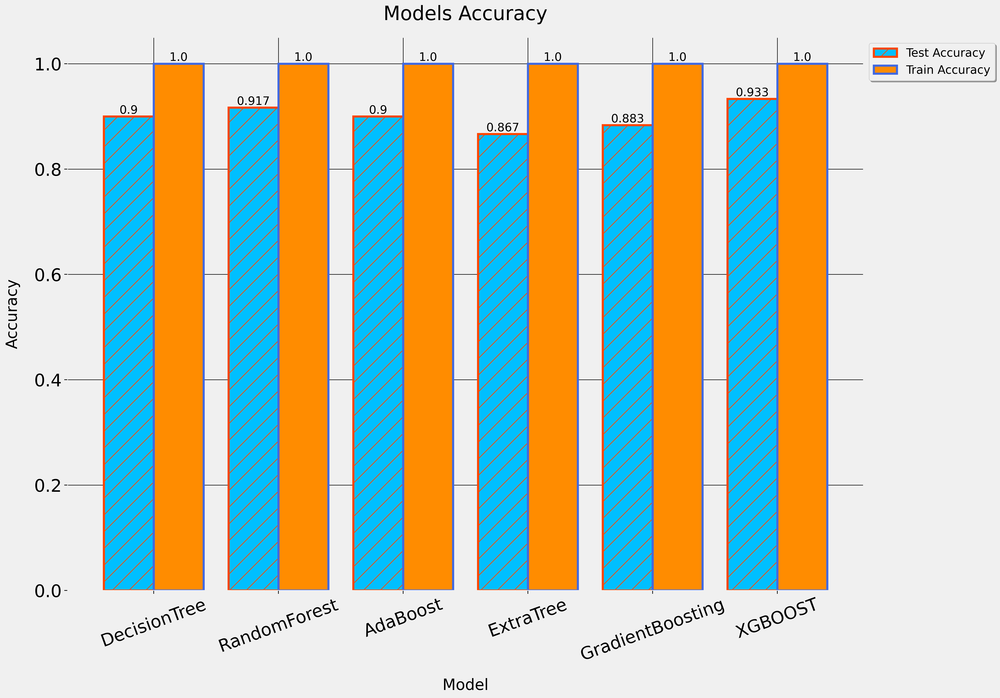

###################################################################
Figure Successsfully Saved to path `figures`.
###################################################################




In [29]:
helper.plot_model_summary(
    model_summary=model_summary, 
    figsize=(20, 14), 
    dpi=300, 
    transparent=True,
    save_visualization=True, 
    figure_name='train_and_test_accuracies_on_selectkbest_features', 
    figure_path='figures',
)

### Plot Feature Importance

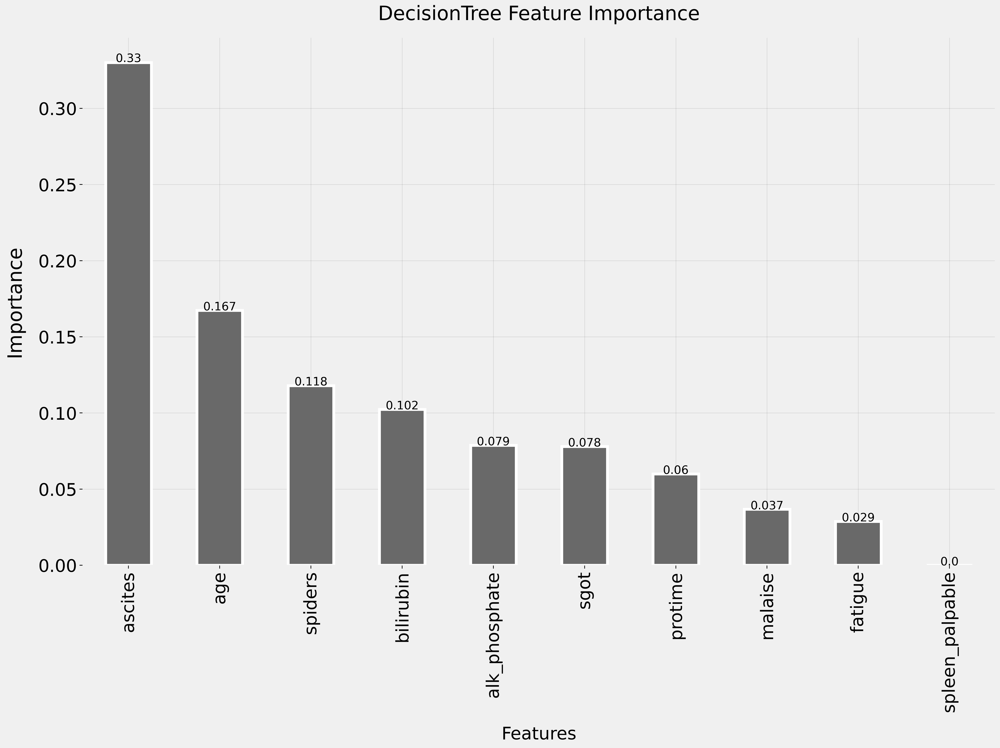

###################################################################
Figure Successsfully Saved to path `figures`.
###################################################################




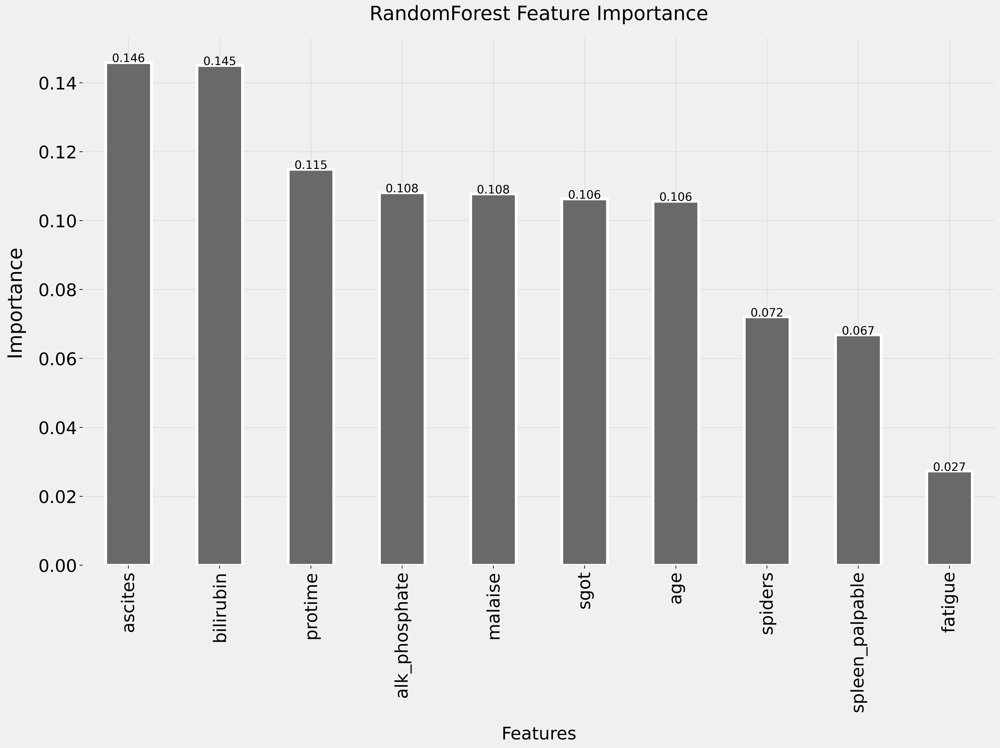

###################################################################
Figure Successsfully Saved to path `figures`.
###################################################################




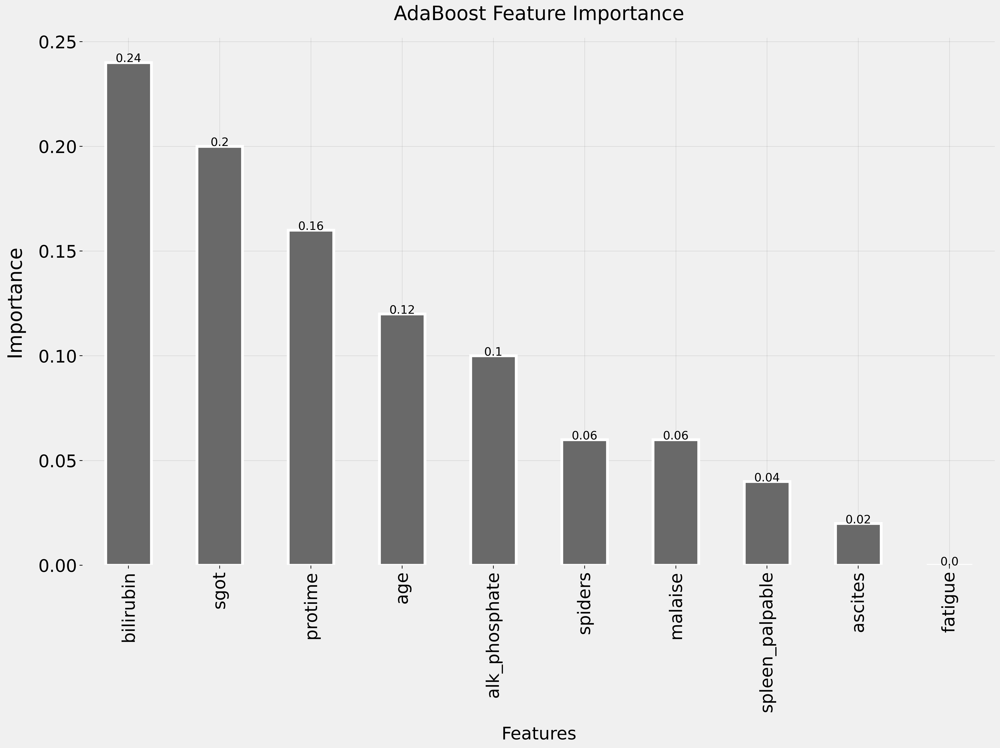

###################################################################
Figure Successsfully Saved to path `figures`.
###################################################################




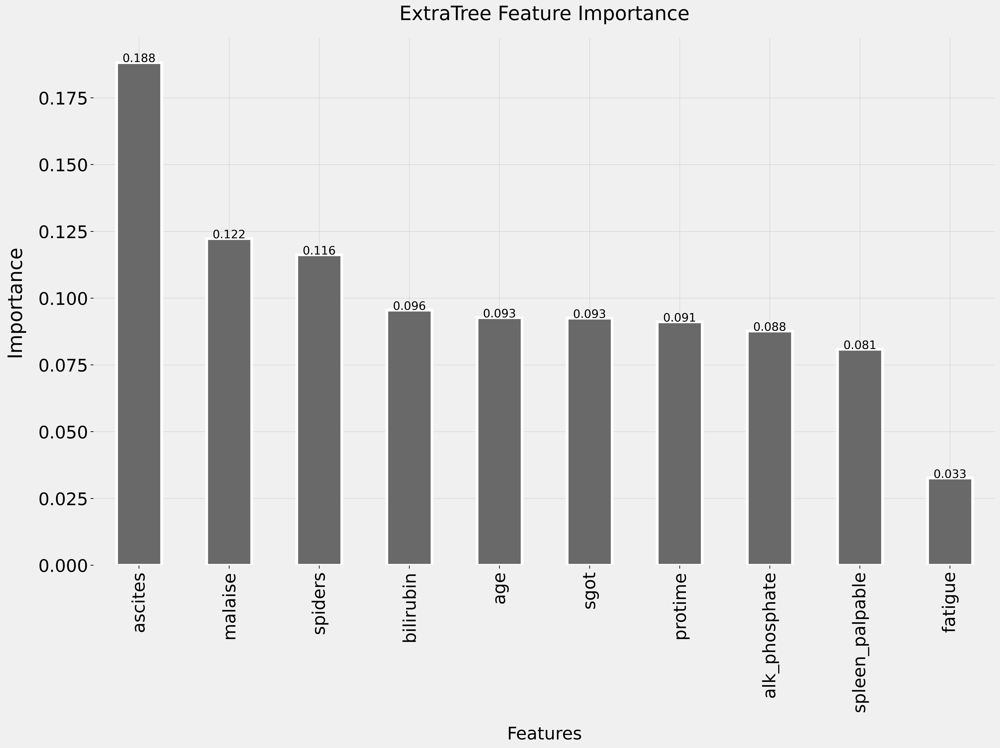

###################################################################
Figure Successsfully Saved to path `figures`.
###################################################################




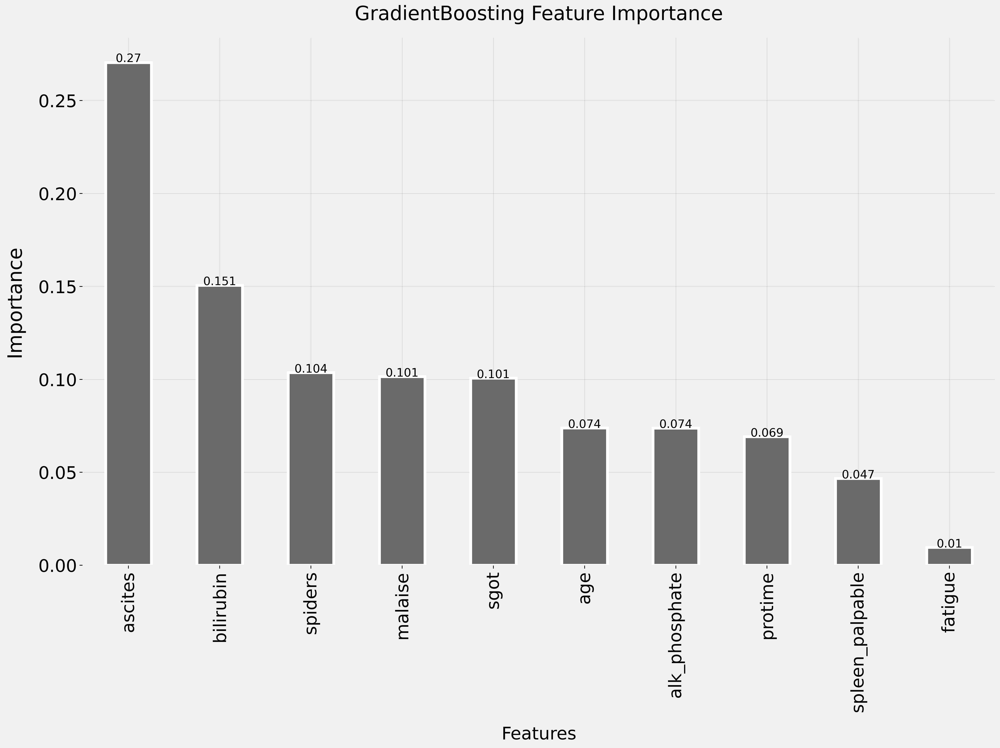

###################################################################
Figure Successsfully Saved to path `figures`.
###################################################################




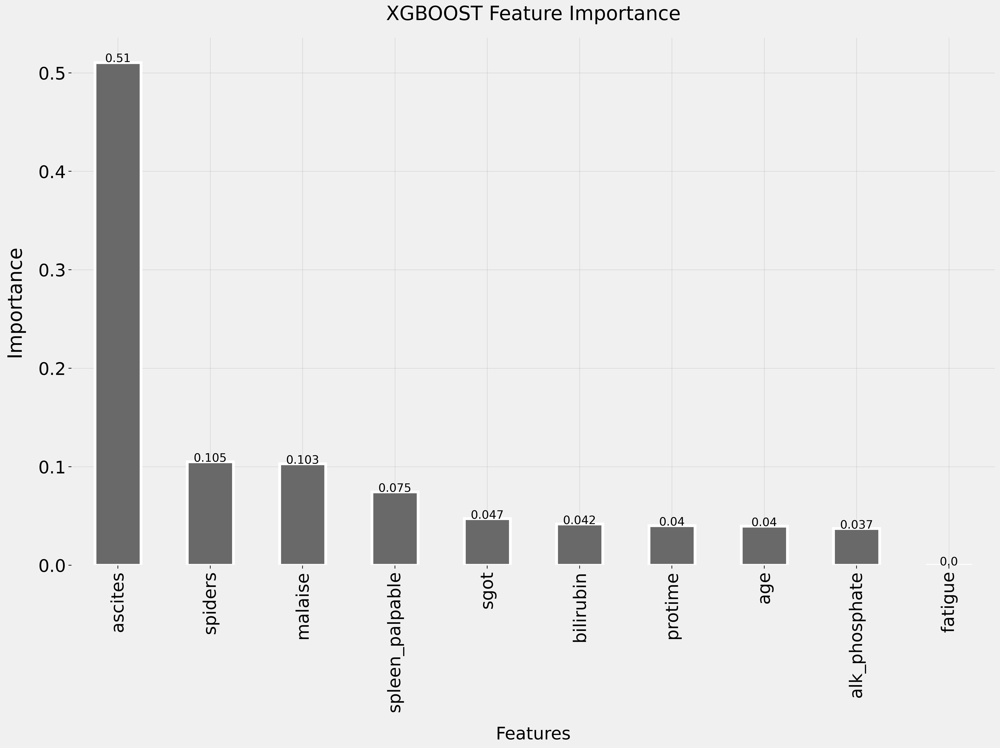

###################################################################
Figure Successsfully Saved to path `figures`.
###################################################################




In [30]:
helper.plot_feature_importance(
    df_model_features_with_importance, 
    figsize=(20, 15), 
    dpi=300, 
    transparent=True,
    annotate_fontsize='xx-large',
    save_plot=True,
    path='figures',
)

---

## Modelling on Top 8 Features

---

### Get Top 8 Features

In [31]:
top_8_features = list(feature_importance_of_models['XGBOOST'].head(8))
top_8_features

['ascites',
 'spiders',
 'malaise',
 'spleen_palpable',
 'sgot',
 'bilirubin',
 'protime',
 'age']

In [32]:
# Save top 8 features to csv
pd.DataFrame(top_8_features, columns=['top_8_features']).to_csv("data/top_8_features.csv", index=False)

### Select X_train and X_test from the Top 8 models

In [33]:
X_train_new = normalized_X_train[top_8_features]

X_train_new.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age
121,1,1,1,0,-0.567675,-0.117869,61,42
102,1,0,0,0,2.107493,2.261567,51,51
96,1,0,0,1,-0.275626,1.033471,61,44
127,0,1,0,1,0.039786,-0.348137,66,54
15,1,1,1,1,-0.415810,-0.348137,61,66


In [34]:
X_test_new = normalized_X_test[top_8_features]

X_test_new.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age
56,1,1,1,1,-0.591039,-0.731917,52,30
171,1,0,0,1,0.834159,0.935904,61,50
189,0,1,1,0,-0.263944,0.248241,51,45
148,1,1,1,1,-0.684495,-0.808673,61,36
185,1,0,0,0,-0.334036,1.438518,52,44


### Create New Folders

In [35]:
helper.create_folder('./csv_tables_2/')
helper.create_folder('./figures_2/')

In [36]:
# Training the models
feature_importance_of_models_new, model_features_with_importance_new, model_summary_new = helper.baseline_performance(
    
    models=models, 
    
    X_train=X_train_new, 
    
    y_train=y_train, 
    
    X_test=X_test_new, 
    
    y_test=y_test, 
    
    column_names=list(top_8_features), 
    
    csv_path='csv_tables_2', 
    
    save_model_summary=True, 
    
    save_feature_importance=True, 
    
    save_feature_imp_of_each_model=True
)

###########################################################################################
Feature Importance csv of DecisionTree Successsfully saved to path `csv_tables_2`.
###########################################################################################


###########################################################################################
Feature Importance csv of RandomForest Successsfully saved to path `csv_tables_2`.
###########################################################################################


###########################################################################################
Feature Importance csv of AdaBoost Successsfully saved to path `csv_tables_2`.
###########################################################################################


###########################################################################################
Feature Importance csv of ExtraTree Successsfully saved to path `csv_tables_2`.
#########################

### Plot Train and Test Accuracies from the Top 8 Features

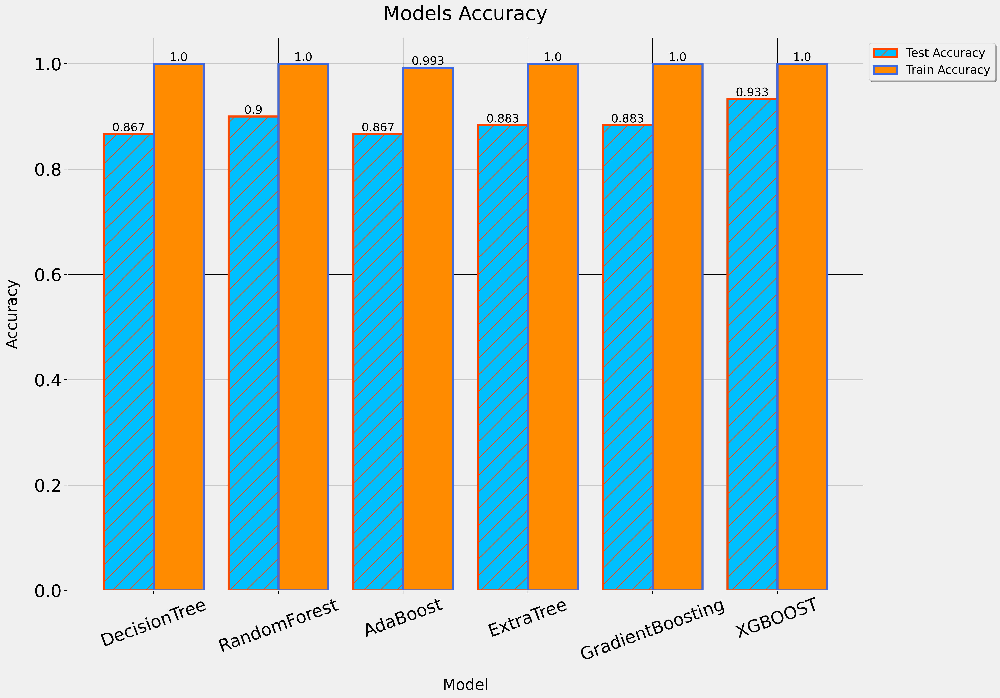

###################################################################
Figure Successsfully Saved to path `figures_2`.
###################################################################




In [37]:
helper.plot_model_summary(
    model_summary=model_summary_new, 
    figsize=(20, 14), 
    dpi=300, 
    transparent=True,
    save_visualization=True, 
    figure_name='train_and_test_accuracies_on_important_features', 
    figure_path='figures_2',
)

### Plot Feature Importance from the Top 8 Features

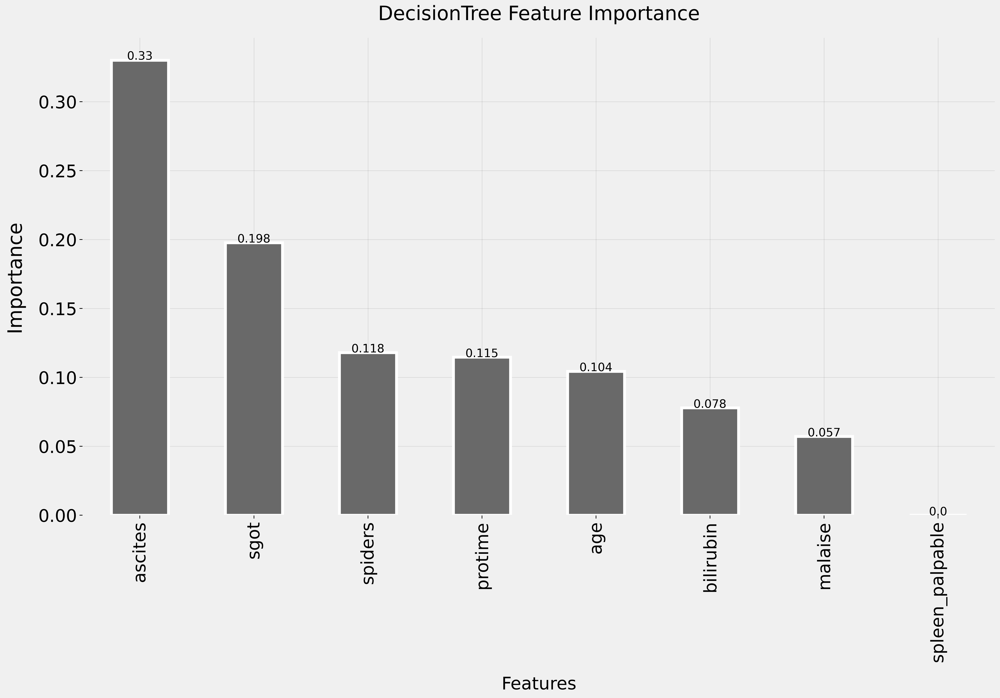

###################################################################
Figure Successsfully Saved to path `figures_2`.
###################################################################




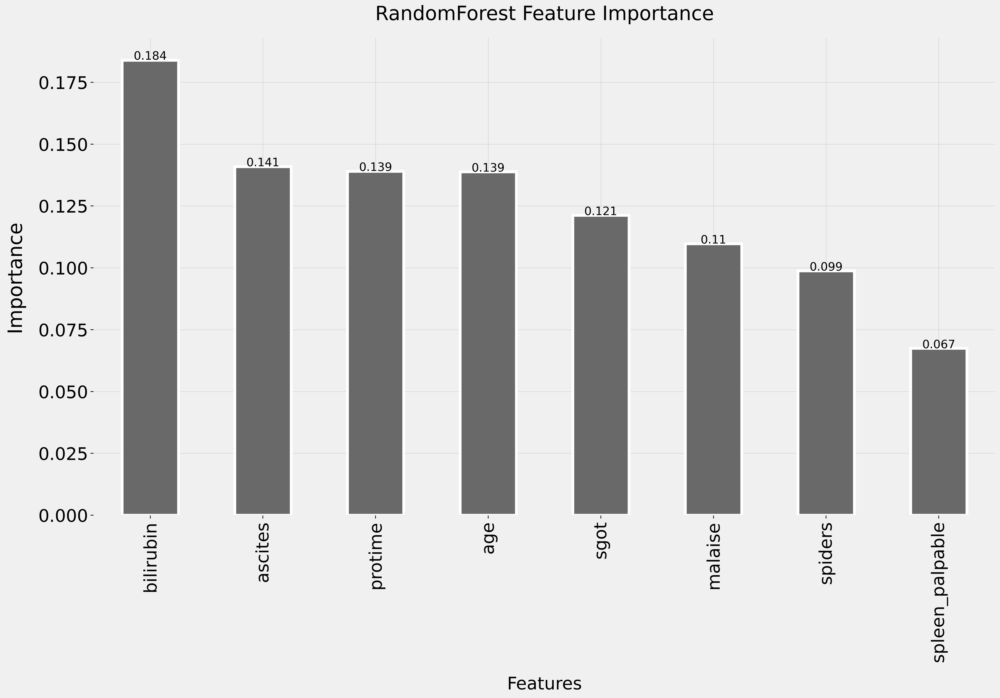

###################################################################
Figure Successsfully Saved to path `figures_2`.
###################################################################




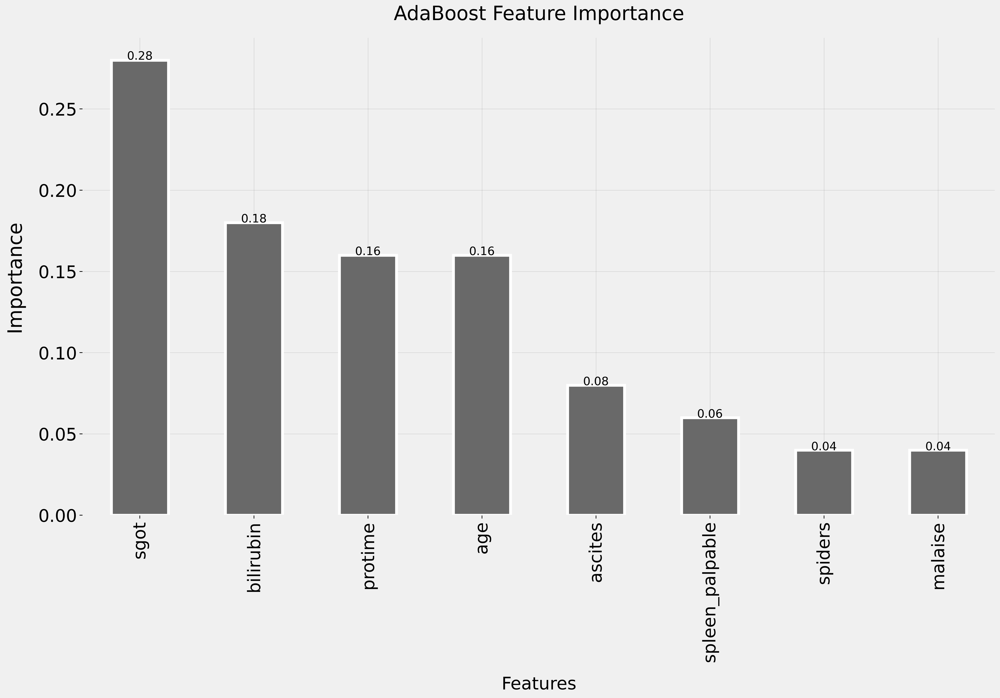

###################################################################
Figure Successsfully Saved to path `figures_2`.
###################################################################




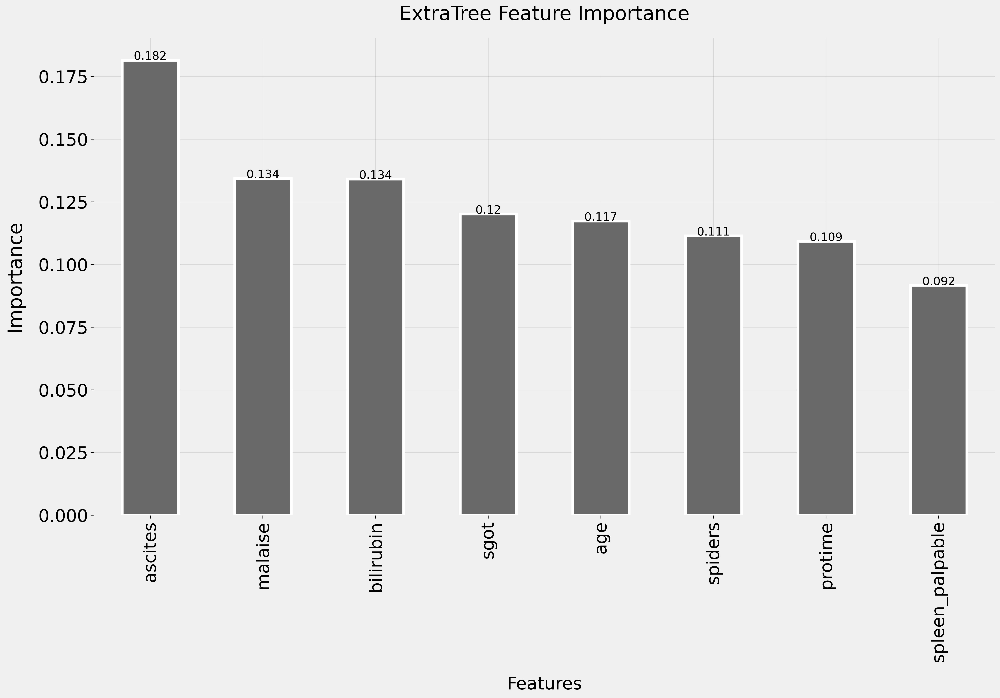

###################################################################
Figure Successsfully Saved to path `figures_2`.
###################################################################




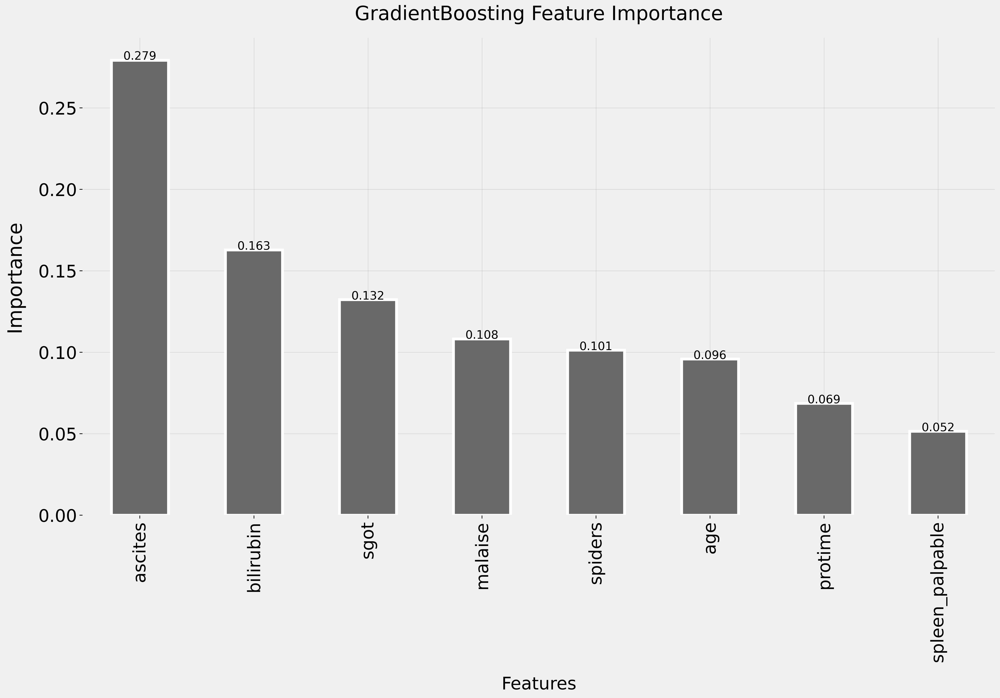

###################################################################
Figure Successsfully Saved to path `figures_2`.
###################################################################




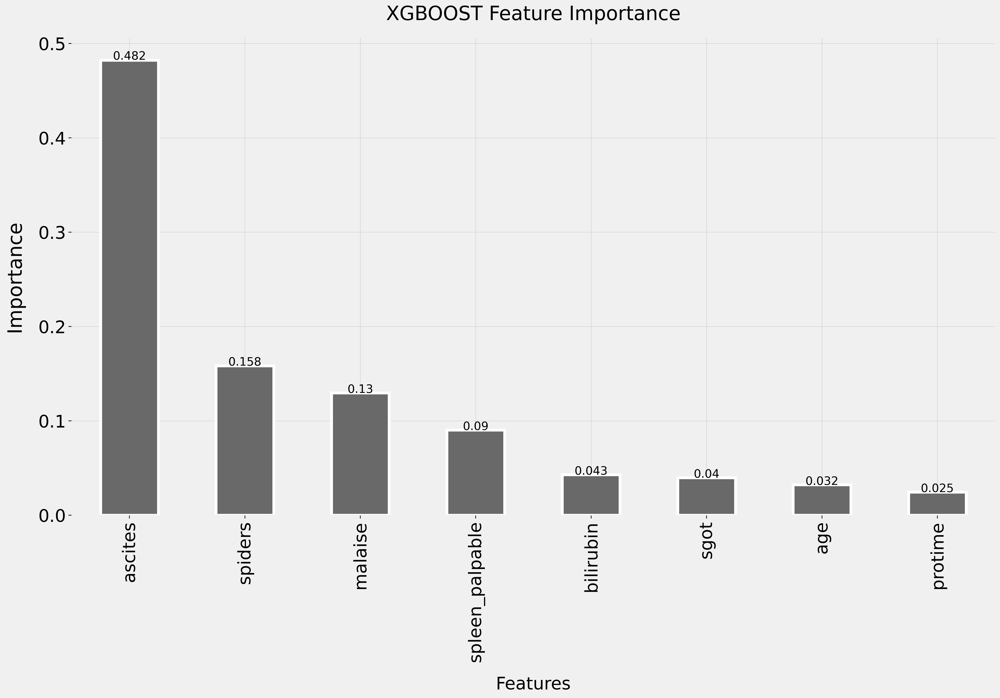

###################################################################
Figure Successsfully Saved to path `figures_2`.
###################################################################




In [38]:
helper.plot_feature_importance(
    feature_importance=model_features_with_importance_new, 
    figsize=(20, 14), 
    dpi=300, 
    transparent=True,
    annotate_fontsize='xx-large',
    save_plot=True,
    path='figures_2',
)

### Choose Model to Evaluate

In [39]:
models

[('DecisionTree', DecisionTreeClassifier(random_state=81)),
 ('RandomForest', RandomForestClassifier(random_state=81)),
 ('AdaBoost', AdaBoostClassifier(random_state=81)),
 ('ExtraTree', ExtraTreesClassifier(random_state=81)),
 ('GradientBoosting', GradientBoostingClassifier(random_state=81)),
 ('XGBOOST',
  XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
                importance_type='gain', interaction_constraints='',
                learning_rate=0.300000012, max_delta_step=0, max_depth=6,
                min_child_weight=1, missing=nan, monotone_constraints='()',
                n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=81,
                reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
                tree_method='exact', validate_parameters=1, verbosity=None))]

In [40]:
classifier = models[5][1]

classifier.fit(X_train_new, y_train)

[03:59:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=81,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

### Get Train and Test Accuracy of the Chosen Model

In [41]:
train_accuracy = classifier.score(X_train_new, y_train)

test_accuracy = classifier.score(X_test_new, y_test)

In [42]:
train_accuracy

1.0

In [43]:
test_accuracy

0.9333333333333333

### Evaluate Classifier

#############################################################
Classifier's Test Accuracy : 0.9333

Classifier's Precision : 0.9459

Classifier's Recall : 0.9459

Classifier's F1-score : 0.9459
#############################################################




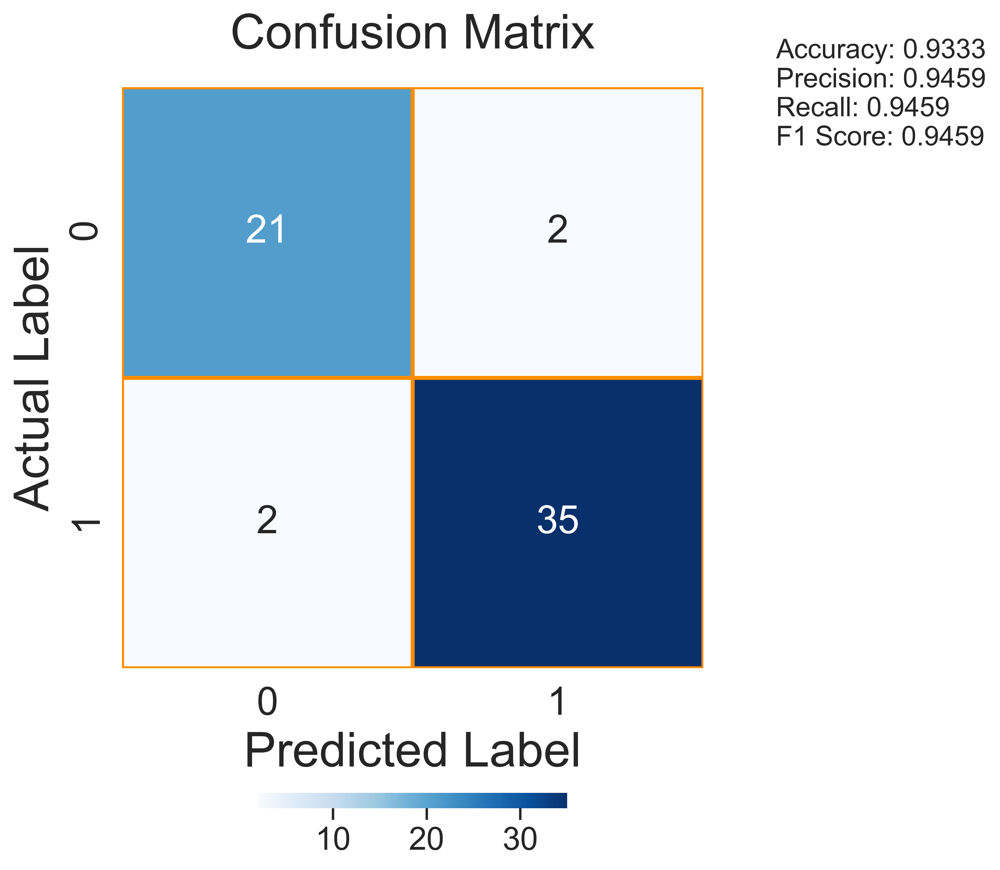

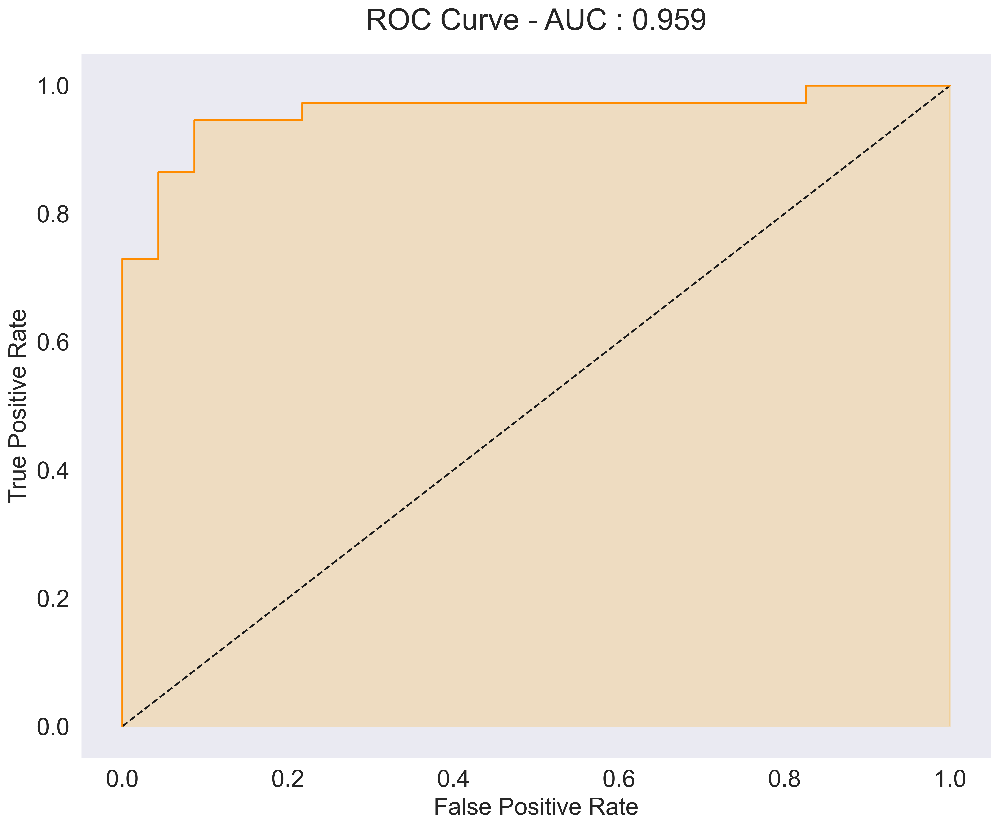

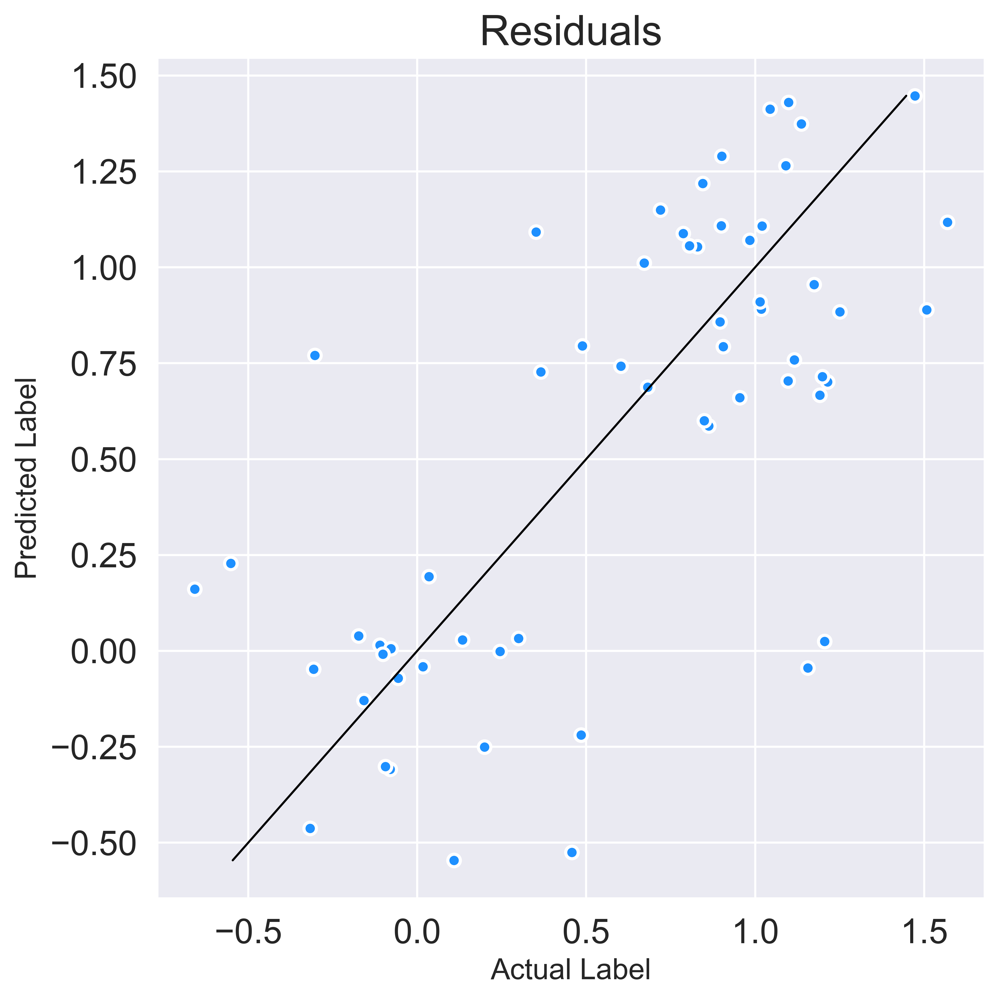

,0,1,accuracy,macro avg,weighted avg
precision,0.913043,0.945946,0.933333,0.929495,0.933333
recall,0.913043,0.945946,0.933333,0.929495,0.933333
f1-score,0.913043,0.945946,0.933333,0.929495,0.933333
support,23.000000,37.000000,0.933333,60.000000,60.000000


In [44]:
helper.evaluate_classifier(
    
    estimator=classifier, 
    
    X_test=X_test_new, 
    
    y_test=y_test,
    
    save_figure=True,
    
    figure_path='figures',
    
    transparent=True, 
    
    dpi=600,
    
    cmap="Blues",
    
    cm_bar_orientation='horizontal',
    
    font_scale_value=1.5,
    
    cbar=True,
)

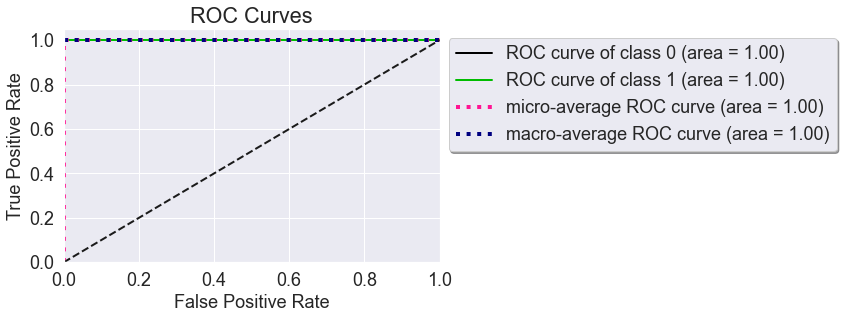

In [45]:
import scikitplot as skplt

# Get prediction
y_pred = classifier.predict(X_test_new)

# Get prediction probability
y_proba = classifier.predict_proba(X_test_new)

skplt.metrics.plot_roc(
    y_true=y_pred, 
    y_probas=y_proba,
#     classes_to_plot=[0]
)

plt.legend(
        bbox_to_anchor=(1, 1), 
        loc="upper left", 
        fontsize='medium', 
        frameon=True, 
        shadow=True, 
        fancybox=True
    )
    
plt.tight_layout()

plt.show()

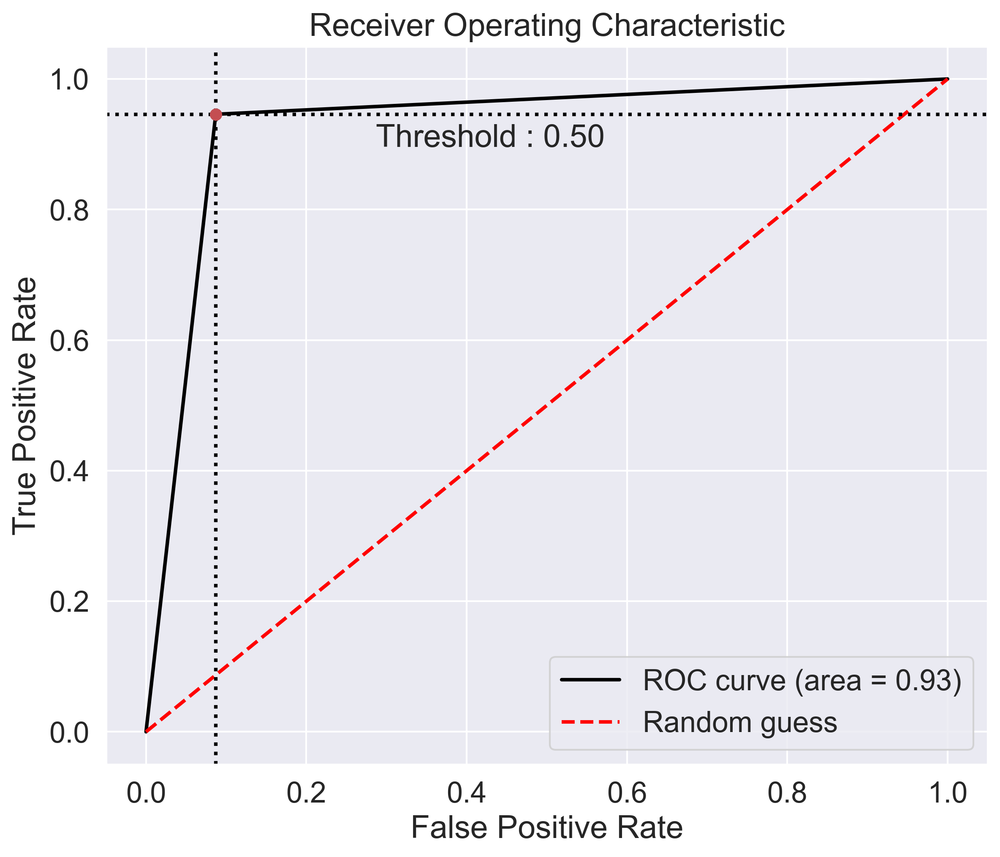

In [46]:
from plot_metric.functions import BinaryClassification

# Visualisation with plot_metric
bc = BinaryClassification(y_test, y_pred, labels=["Class 1", "Class 2"])

plt.figure(figsize=(8, 7), dpi=300)

bc.plot_roc_curve()

plt.show()

---

## Intepreting with Lime

---

In [47]:
target_names = ['Die', 'Live']

feature_names = X_test_new.columns

class_names = ["Die(0)", "Live(1)"]

number_of_features = len(feature_names)

X_test_sample = X_test_new.iloc[1]

sample_label = y_test.iloc[1]

In [48]:
X_test_sample

ascites             1.000000
spiders             0.000000
malaise             0.000000
spleen_palpable     1.000000
sgot                0.834159
bilirubin           0.935904
protime            61.000000
age                50.000000
Name: 171, dtype: float64

In [49]:
sample_label

0

## Create Explainer

In [50]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    
    training_data=X_train_new.values, 
    
    feature_names=feature_names, 
    
    class_names=class_names, 
    
    discretize_continuous=True, 
    
    random_state=81,
)

In [51]:
explainer_instance = explainer.explain_instance(
    
    data_row=X_test_sample,
    
    predict_fn=classifier.predict_proba,
    
    num_features=number_of_features, 
    
    top_labels=0
)

In [52]:
explainer_instance.show_in_notebook(show_table=True, show_all=True)

## Save Explainer Instance as a DataFrame

In [53]:
explainer_df = pd.DataFrame(explainer_instance.as_list())

# Save to csv
explainer_df.to_csv('csv_tables/explainer_results.csv', index=False)
explainer_df

,0,1
0,bilirubin > 0.27,-0.227521
1,0.00 < spleen_palpable <= 1.00,0.199091
2,47.25 < protime <= 61.00,0.110837
3,spiders <= 0.00,-0.106952
4,malaise <= 0.00,-0.103961
5,sgot > 0.29,0.096750
6,44.00 < age <= 50.75,-0.049033
7,ascites <= 1.00,0.000000


## Plot Explainer Instance

<Figure size 7500x3000 with 0 Axes>

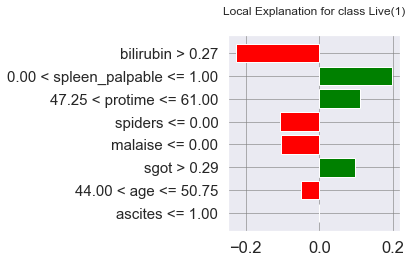

In [54]:
plt.figure(figsize=(25, 10), dpi=300)

explainer_instance.as_pyplot_figure(label=1)

plt.title('Local Explanation for class Live(1)', fontsize=12, pad=20)

plt.yticks(fontsize=15)

plt.grid(b=True, alpha=0.6, color='grey')

plt.tight_layout()

plt.savefig('figures/lime_tabular_explainer.png', dpi=600, transparent=True)

plt.show()

---

## Save Classifier

In [55]:
# Create folder
helper.create_folder('./saved_models/')

In [56]:
with open('saved_models/xgboost_classifier', 'wb') as file:
    pickle.dump(classifier, file)

## Save Scaler Object

In [57]:
with open('saved_models/scaler_object', 'wb') as file:
    pickle.dump(scaler, file)

---

## Working on New Data

---

In [58]:
with open('saved_models/xgboost_classifier','rb') as model_file, open('saved_models/scaler_object', 'rb') as scaler_file:
    loaded_classifier = pickle.load(model_file)
    loaded_scaler = pickle.load(scaler_file)

### Get Data Sample

In [59]:
data_sample = X_train[top_8_features].iloc[50:100, :].copy()

In [60]:
data_sample.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age
74,1,1,0,1,45,1.000000,56,32
135,1,0,1,1,33,0.800000,61,51
154,0,0,0,1,21,1.455672,49,44
81,1,1,1,1,31,0.700000,100,30
45,1,0,1,1,80,0.600000,61,37


In [61]:
len(data_sample)

50

### Get Targets

In [62]:
new_target = y_train.iloc[50:100].copy()

### Scale

In [63]:
# # Making a copy of X_train
# scaled_data_sample = data_sample.copy()


# # Initializing Columns to Scale
# columns_to_scale = ['bilirubin', 'sgot']

# # Normalizing data_sample
# scaled_data_sample[columns_to_scale] = loaded_scaler.fit_transform(
#     scaled_data_sample[columns_to_scale]
# )

# scaled_data_sample.head()

### Get Prediction

In [64]:
new_prediction = loaded_classifier.predict(data_sample)

### Get Predicted Probability

In [65]:
predicted_probability = loaded_classifier.predict_proba(data_sample)[:, 0]

In [66]:
predicted_probability

array([0.09006077, 0.3052289 , 0.9415152 , 0.1022771 , 0.44400817,
       0.9665794 , 0.04041618, 0.9069342 , 0.05578893, 0.04835021,
       0.701336  , 0.40191692, 0.8834916 , 0.22807133, 0.92797923,
       0.07780212, 0.05902964, 0.28027463, 0.5714788 , 0.68871826,
       0.99569345, 0.9312088 , 0.8939791 , 0.6259254 , 0.9825692 ,
       0.16399169, 0.11047328, 0.6047761 , 0.82999766, 0.02189785,
       0.14691162, 0.32807422, 0.02853477, 0.12380964, 0.9467708 ,
       0.9860285 , 0.1780523 , 0.96985507, 0.06651127, 0.13891977,
       0.0762915 , 0.04670912, 0.01485735, 0.27067006, 0.09969831,
       0.11295569, 0.04041618, 0.4043663 , 0.0762915 , 0.9786366 ],
      dtype=float32)

### Final Data Output

In [67]:
data_sample["class"] = new_target

data_sample["predicted_outputs"] = new_prediction

data_sample["prediction_probability"] = predicted_probability

data_sample.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age,class,predicted_outputs,prediction_probability
74,1,1,0,1,45,1.000000,56,32,1,1,0.090061
135,1,0,1,1,33,0.800000,61,51,1,1,0.305229
154,0,0,0,1,21,1.455672,49,44,0,0,0.941515
81,1,1,1,1,31,0.700000,100,30,1,1,0.102277
45,1,0,1,1,80,0.600000,61,37,1,1,0.444008


In [68]:
data_sample['predicted_outputs'].nunique()

2

### Incorrect Predictions

In [69]:
incorrect_predictions = data_sample[data_sample['class'] != data_sample['predicted_outputs']]

incorrect_predictions.to_csv('data/incorrect_predictions_from_sampled_data.csv', index=False)

incorrect_predictions

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age,class,predicted_outputs,prediction_probability
122,1,0,1,1,231,0.9,61,37,1,0,0.701336
70,1,0,0,1,182,2.8,61,34,0,1,0.401917
120,0,0,0,1,118,1.0,23,20,1,0,0.688718
124,1,0,0,1,24,0.7,100,34,1,0,0.625925


### Save Data to `csv`

In [70]:
data_sample.to_csv('data/data_with_predictions.csv', index=False)

## Analysis of Prediction Results

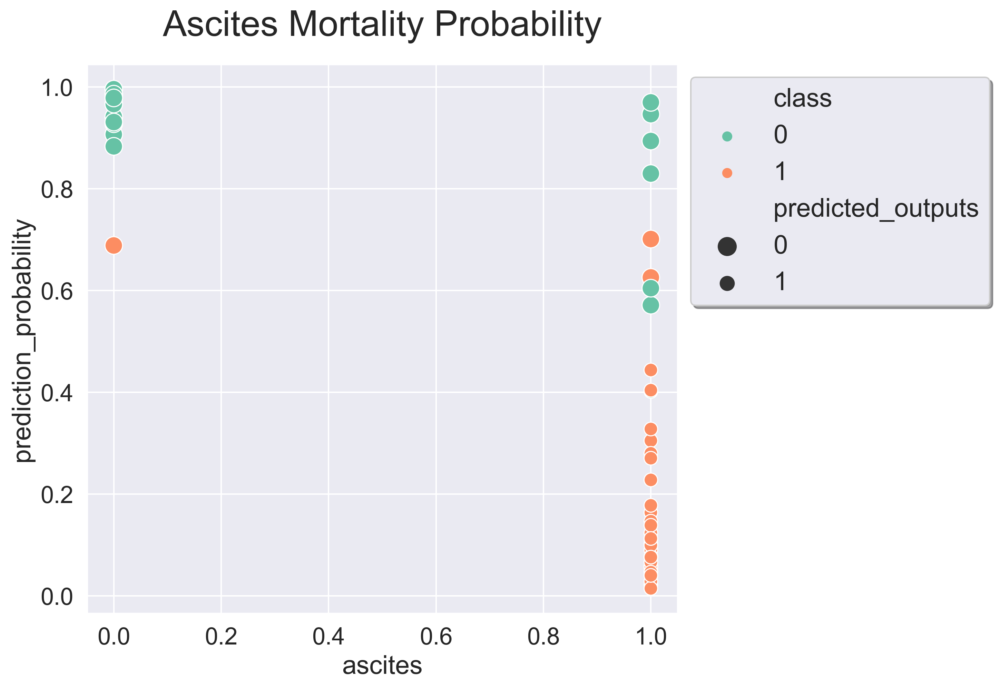

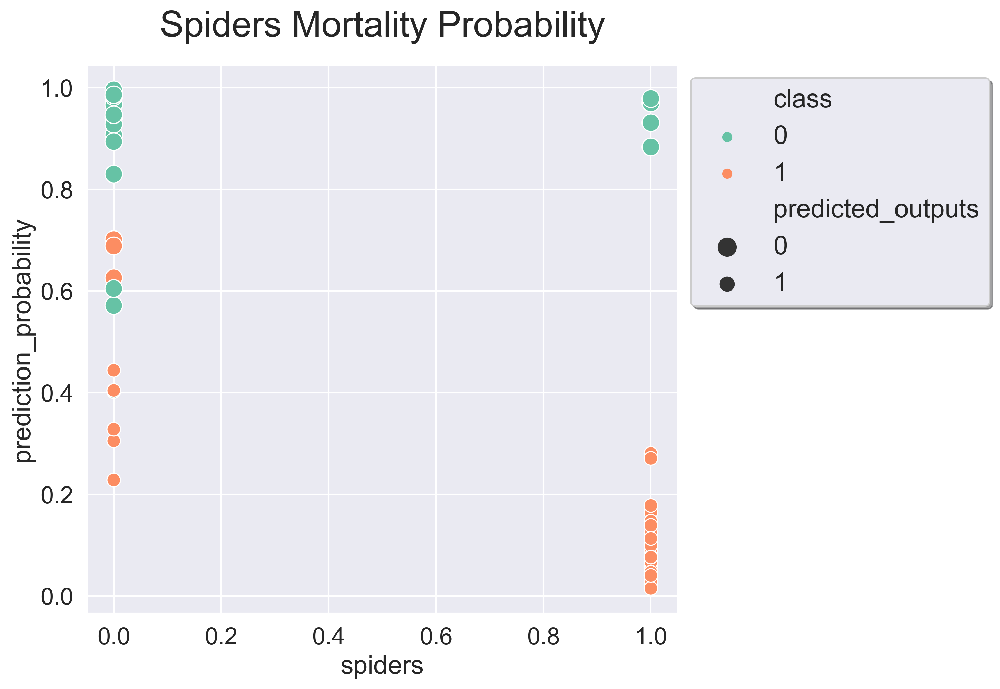

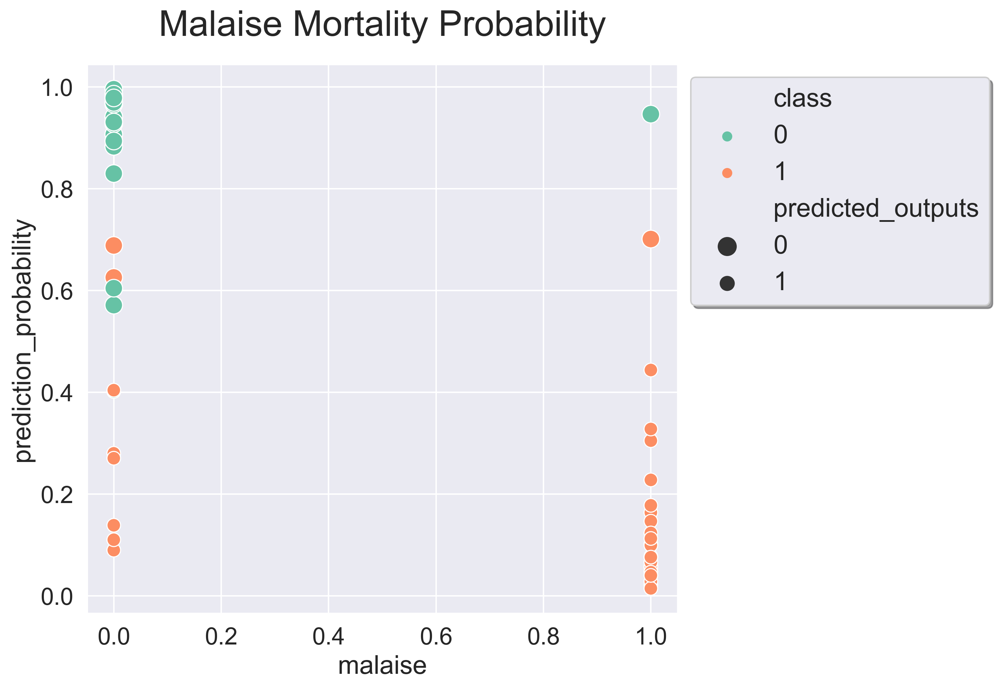

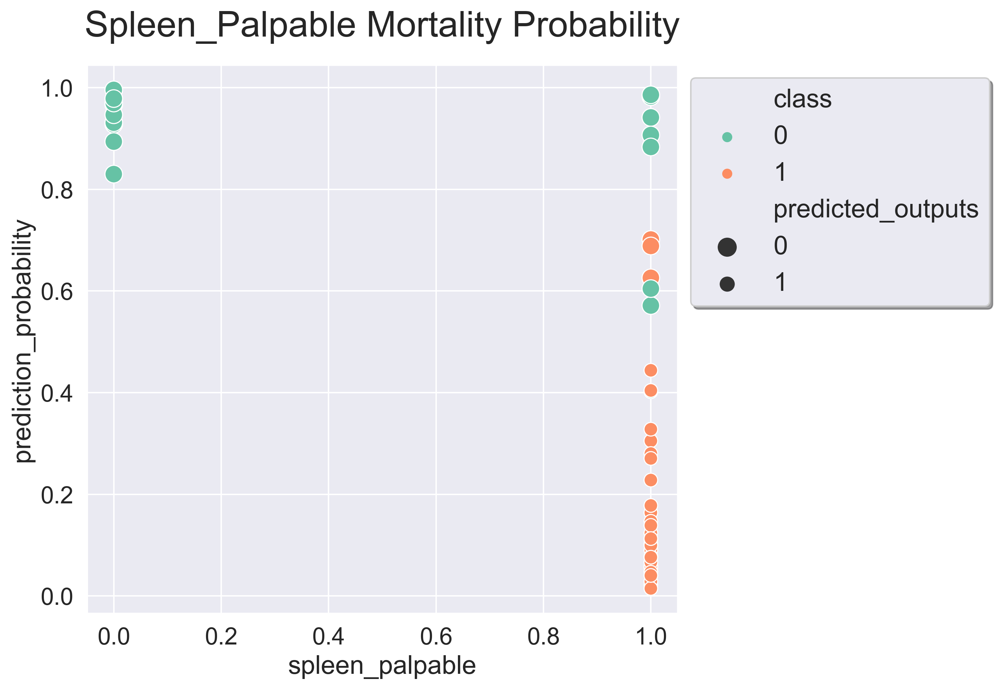

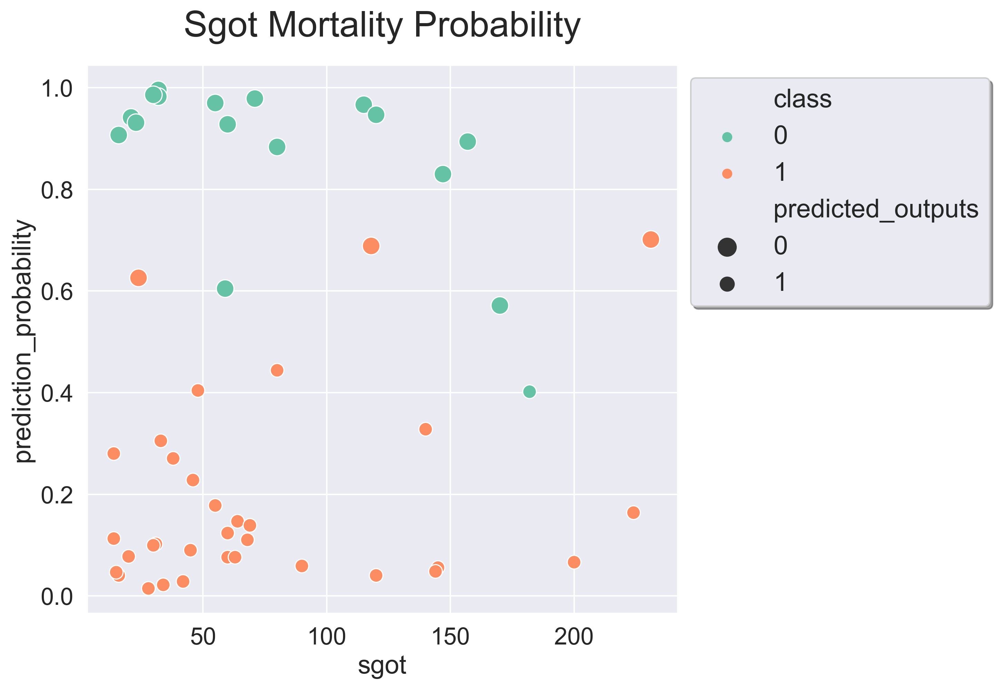

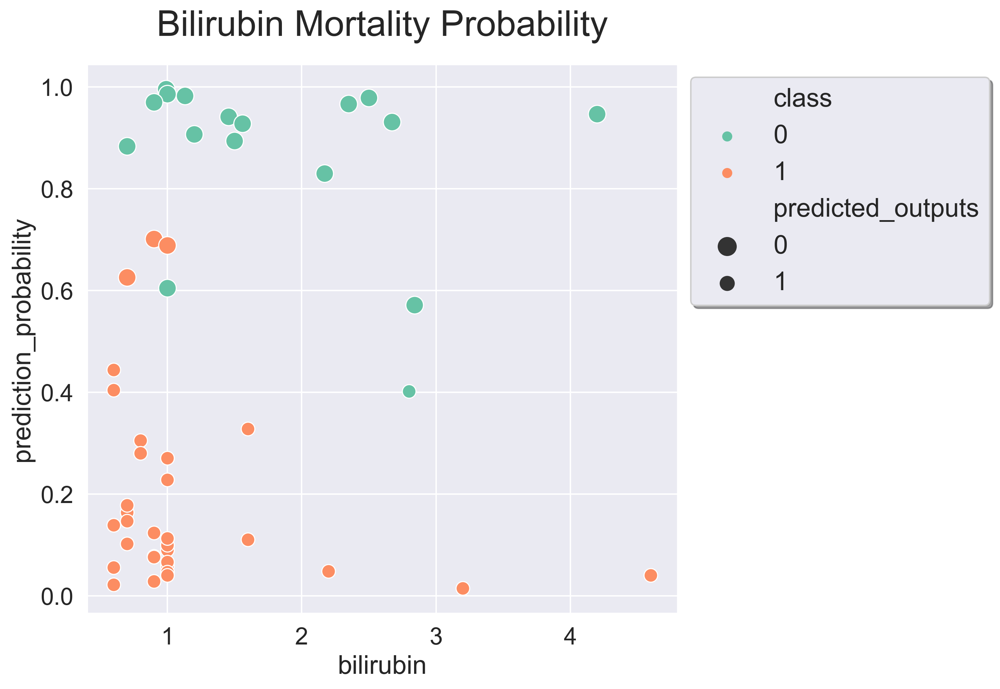

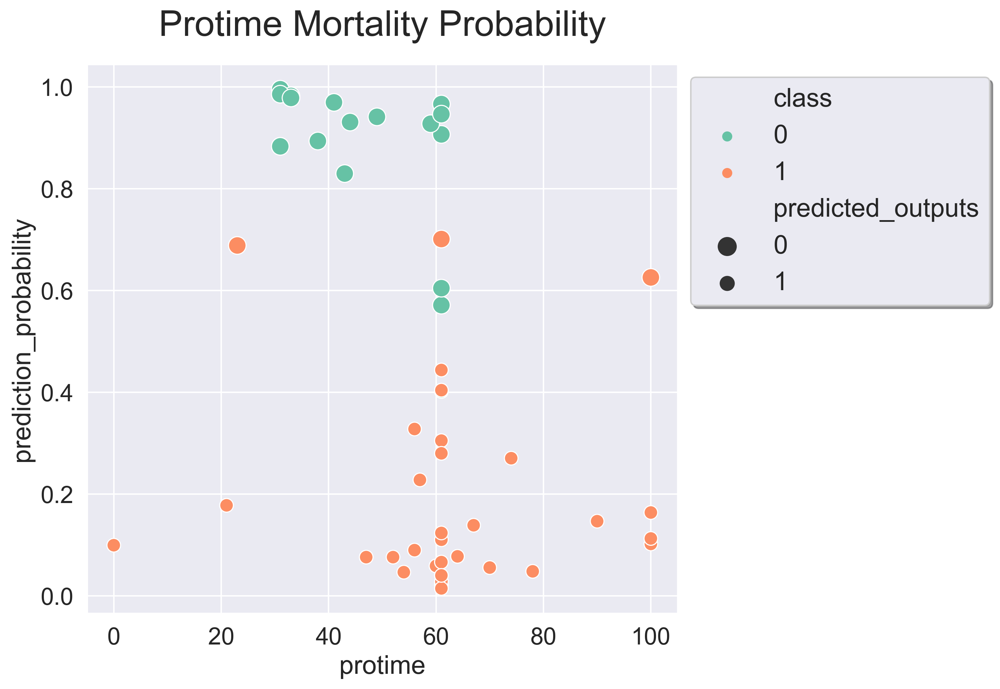

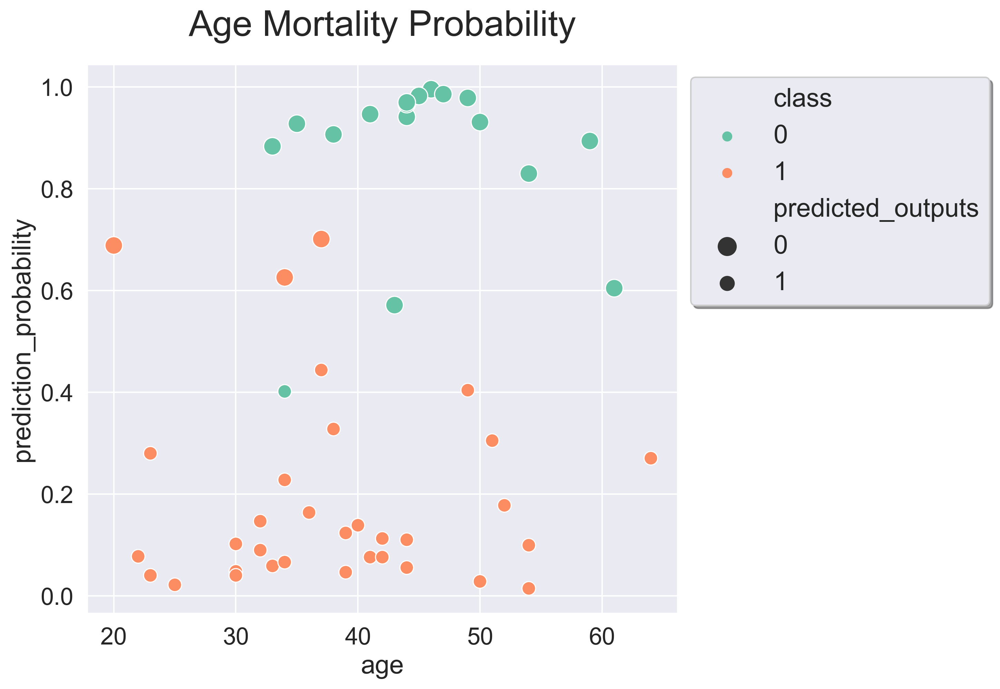

In [71]:
# Get columns names
col_names = data_sample.columns[:8]

# Plot results
for col_name in col_names:
    
    plt.figure(figsize=(10, 7), dpi=300)
    
    sns.scatterplot(
        x=col_name, 
        y='prediction_probability', 
        data=data_sample, 
        hue='class',
        size='predicted_outputs',
        sizes=(90, 150),
        palette='Set2',
    )
    
    plt.title(f'{col_name.title()} Mortality Probability', fontsize=25, pad=20)
    
    plt.legend(
        bbox_to_anchor=(1, 1), 
        loc="upper left", 
        fontsize='medium', 
        frameon=True, 
        shadow=True, 
        fancybox=True
    )
    
    plt.tight_layout()
    
    plt.savefig(f'figures/{col_name.lower()}_mortality_probability.png', dpi=600, transparent=True)
    
    plt.show()

### Relplot

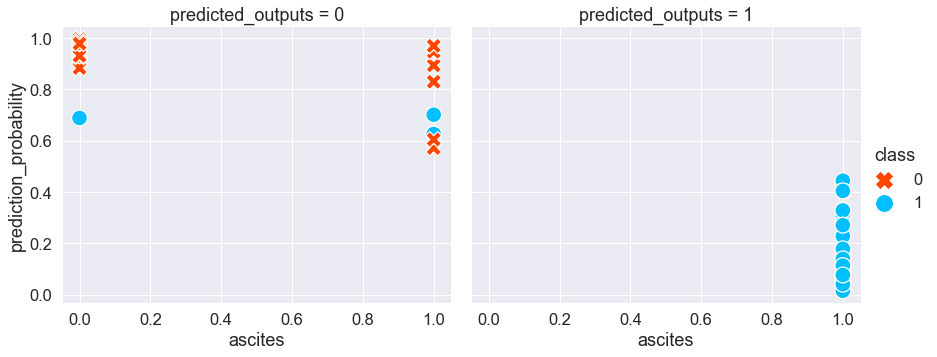

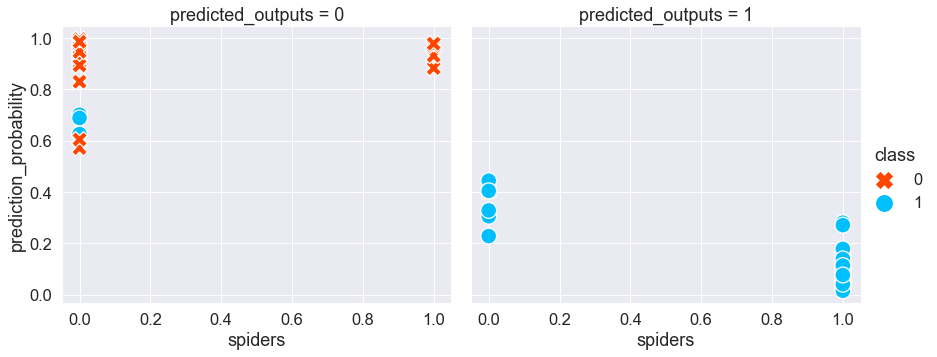

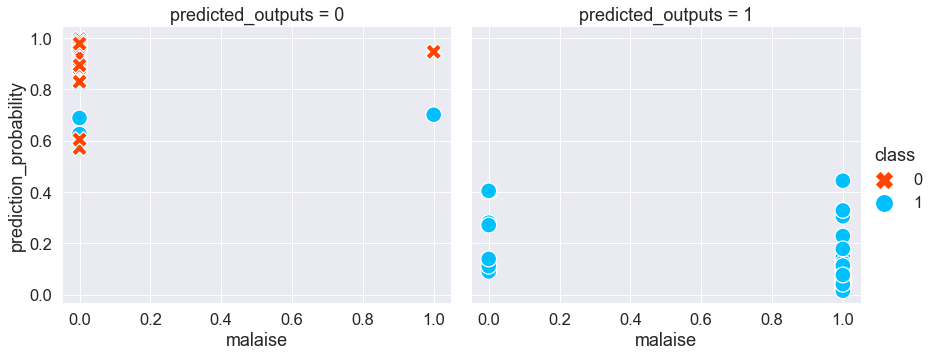

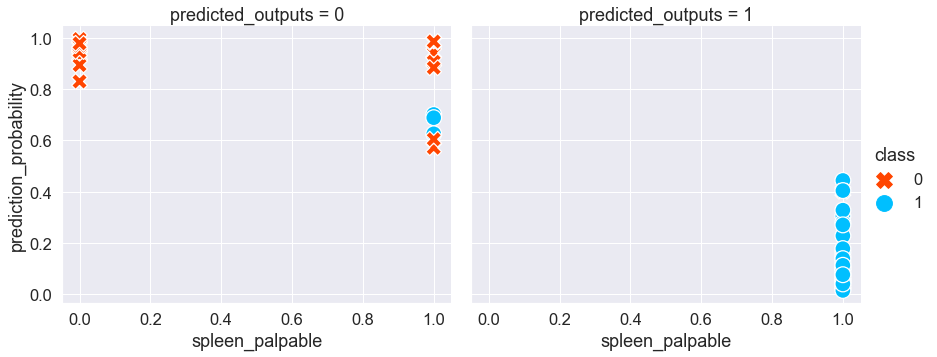

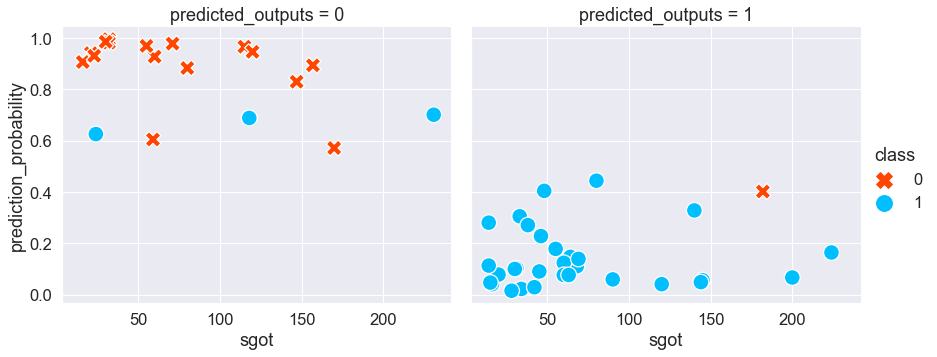

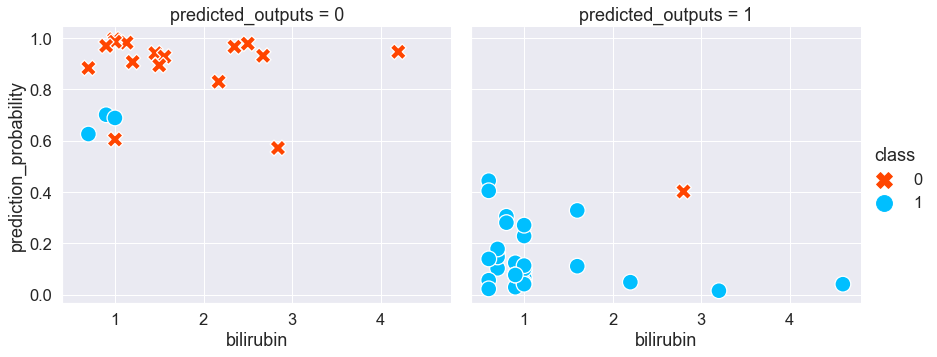

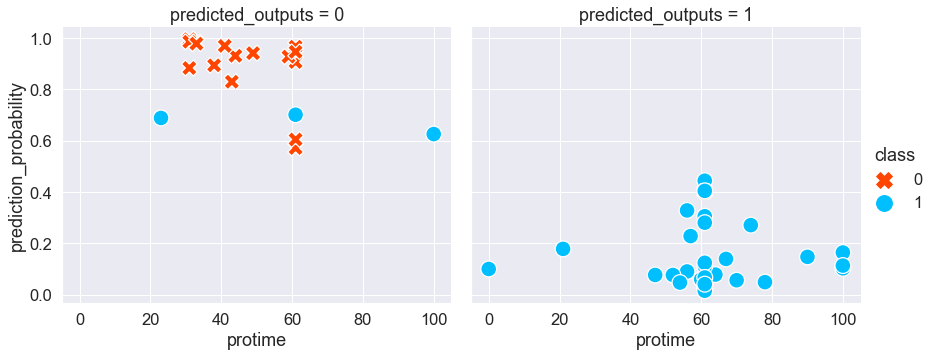

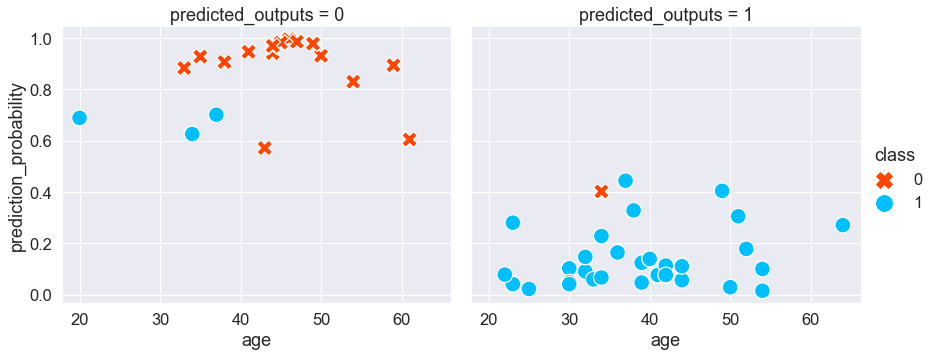

In [72]:
hue_colors = {
    0: 'orangered', 
    1: 'deepskyblue',
}

markers = {
    0: 'X',
    1: 'o',
}


# Plot results
for col_name in col_names:

    sns.relplot(
        x=col_name, 
        y='prediction_probability', 
        data=data_sample, 
        hue='class',
        size='class',
        sizes=(250, 250),
        style='class',
        col='predicted_outputs',
        markers=markers,
        palette=hue_colors,
        height=5,
        aspect=1.2,

    );
    
    plt.savefig(f'figures/relplot_of_{col_name.lower()}_mortality_probability.png', dpi=600, transparent=True)

    plt.show()

---

## Modelling with Neural Nets

---

In [73]:
# Partition Resampled Data 

X_train_, X_test_, y_train_, y_test_ = model_selection.train_test_split(
    
    resampled_X[top_8_features], 
    
    resampled_y, 
    
    test_size=0.3, 
    
    stratify=resampled_y, 
    
    random_state=seed,
)

In [74]:
X_train_.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age
121,1,1,1,0,40,1.5,61,42
102,1,0,0,0,269,4.6,51,51
96,1,0,0,1,65,3.0,61,44
127,0,1,0,1,92,1.2,66,54
15,1,1,1,1,53,1.2,61,66


In [75]:
X_test_.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age
56,1,1,1,1,38,0.700000,52,30
171,1,0,0,1,160,2.872886,61,50
189,0,1,1,0,66,1.976979,51,45
148,1,1,1,1,30,0.600000,61,36
185,1,0,0,0,60,3.527707,52,44


## Data Scaling

In [76]:
# Make a copy of X_train
normalized_X_train_ = X_train_.copy()

# Make a copy of X_test
normalized_X_test_ = X_test_.copy()

# Initialize Columns to Scale
column_names_to_scale = ['bilirubin', 'sgot']

# Normalize X_train
normalized_X_train_[column_names_to_scale] = loaded_scaler.fit_transform(normalized_X_train_[column_names_to_scale])

# Normalize X_test
normalized_X_test_[column_names_to_scale] = loaded_scaler.transform(normalized_X_test_[column_names_to_scale])    

In [77]:
normalized_X_train_.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age
121,1,1,1,0,-0.567675,-0.117869,61,42
102,1,0,0,0,2.107493,2.261567,51,51
96,1,0,0,1,-0.275626,1.033471,61,44
127,0,1,0,1,0.039786,-0.348137,66,54
15,1,1,1,1,-0.415810,-0.348137,61,66


In [78]:
normalized_X_test_.head()

,ascites,spiders,malaise,spleen_palpable,sgot,bilirubin,protime,age
56,1,1,1,1,-0.591039,-0.731917,52,30
171,1,0,0,1,0.834159,0.935904,61,50
189,0,1,1,0,-0.263944,0.248241,51,45
148,1,1,1,1,-0.684495,-0.808673,61,36
185,1,0,0,0,-0.334036,1.438518,52,44


## Reshape

In [79]:
# Reshape Normalized_X_test
normalized_X_train_ = np.reshape(
    np.array(normalized_X_train_),
    (
        np.array(normalized_X_train_).shape[0], 1, 
        np.array(normalized_X_train_).shape[1]
    )
)

# Reshape Normalized_X_test
normalized_X_test_ = np.reshape(
    np.array(normalized_X_test_),
    (
        np.array(normalized_X_test_).shape[0], 1, 
        np.array(normalized_X_test_).shape[1]
    )
)

In [80]:
print(f"Number of features: {number_of_features}")

Number of features: 8


## Create the Neural Network

In [81]:
lstm_model = tf.keras.Sequential()

lstm_model.add(tf.keras.layers.LSTM(25, input_shape=(1, number_of_features)))

lstm_model.add(tf.keras.layers.Dropout(0.1))

lstm_model.add(tf.keras.layers.Dense(1))

lstm_model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

lstm_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])

lstm_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 25)                3400      
_________________________________________________________________
dropout (Dropout)            (None, 25)                0         
_________________________________________________________________
dense (Dense)                (None, 1)                 26        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 2         
Total params: 3,428
Trainable params: 3,428
Non-trainable params: 0
_________________________________________________________________


## Fit and Score the Neural Network

In [82]:
history = lstm_model.fit(
    normalized_X_train_, 
    y_train_, 
    epochs=300, 
    batch_size=10,
    validation_data=(normalized_X_test_, y_test_),
    verbose=2,
)

Epoch 1/300
14/14 - 3s - loss: 0.7355 - accuracy: 0.4855 - val_loss: 0.6276 - val_accuracy: 0.6667
Epoch 2/300
14/14 - 0s - loss: 0.6190 - accuracy: 0.6449 - val_loss: 0.6010 - val_accuracy: 0.6500
Epoch 3/300
14/14 - 0s - loss: 0.6050 - accuracy: 0.6957 - val_loss: 0.5871 - val_accuracy: 0.6833
Epoch 4/300
14/14 - 0s - loss: 0.5666 - accuracy: 0.7681 - val_loss: 0.5650 - val_accuracy: 0.7167
Epoch 5/300
14/14 - 0s - loss: 0.5879 - accuracy: 0.7319 - val_loss: 0.5575 - val_accuracy: 0.7333
Epoch 6/300
14/14 - 0s - loss: 0.5722 - accuracy: 0.7246 - val_loss: 0.5468 - val_accuracy: 0.7167
Epoch 7/300
14/14 - 0s - loss: 0.5591 - accuracy: 0.7536 - val_loss: 0.5379 - val_accuracy: 0.7167
Epoch 8/300
14/14 - 0s - loss: 0.5343 - accuracy: 0.7391 - val_loss: 0.5281 - val_accuracy: 0.7000
Epoch 9/300
14/14 - 0s - loss: 0.5354 - accuracy: 0.7536 - val_loss: 0.5160 - val_accuracy: 0.7333
Epoch 10/300
14/14 - 0s - loss: 0.5387 - accuracy: 0.7754 - val_loss: 0.5161 - val_accuracy: 0.7333
Epoch 11/

14/14 - 0s - loss: 0.2165 - accuracy: 0.9203 - val_loss: 0.3105 - val_accuracy: 0.9000
Epoch 84/300
14/14 - 0s - loss: 0.2372 - accuracy: 0.9203 - val_loss: 0.3368 - val_accuracy: 0.9000
Epoch 85/300
14/14 - 0s - loss: 0.2202 - accuracy: 0.9275 - val_loss: 0.3247 - val_accuracy: 0.9000
Epoch 86/300
14/14 - 0s - loss: 0.2696 - accuracy: 0.9058 - val_loss: 0.3706 - val_accuracy: 0.8333
Epoch 87/300
14/14 - 0s - loss: 0.2641 - accuracy: 0.8913 - val_loss: 0.3242 - val_accuracy: 0.8833
Epoch 88/300
14/14 - 0s - loss: 0.2391 - accuracy: 0.9058 - val_loss: 0.3424 - val_accuracy: 0.9000
Epoch 89/300
14/14 - 0s - loss: 0.2325 - accuracy: 0.8841 - val_loss: 0.3495 - val_accuracy: 0.8833
Epoch 90/300
14/14 - 0s - loss: 0.2328 - accuracy: 0.9275 - val_loss: 0.3399 - val_accuracy: 0.9000
Epoch 91/300
14/14 - 0s - loss: 0.2018 - accuracy: 0.9493 - val_loss: 0.3365 - val_accuracy: 0.8833
Epoch 92/300
14/14 - 0s - loss: 0.2254 - accuracy: 0.9420 - val_loss: 0.3247 - val_accuracy: 0.9000
Epoch 93/300


Epoch 165/300
14/14 - 0s - loss: 0.1678 - accuracy: 0.9275 - val_loss: 0.3738 - val_accuracy: 0.8833
Epoch 166/300
14/14 - 0s - loss: 0.1951 - accuracy: 0.9130 - val_loss: 0.3790 - val_accuracy: 0.9000
Epoch 167/300
14/14 - 0s - loss: 0.1852 - accuracy: 0.9275 - val_loss: 0.3831 - val_accuracy: 0.9000
Epoch 168/300
14/14 - 0s - loss: 0.1842 - accuracy: 0.9420 - val_loss: 0.3645 - val_accuracy: 0.8833
Epoch 169/300
14/14 - 0s - loss: 0.1678 - accuracy: 0.9420 - val_loss: 0.3566 - val_accuracy: 0.8833
Epoch 170/300
14/14 - 0s - loss: 0.1694 - accuracy: 0.9348 - val_loss: 0.3658 - val_accuracy: 0.9000
Epoch 171/300
14/14 - 0s - loss: 0.1731 - accuracy: 0.9420 - val_loss: 0.3784 - val_accuracy: 0.9000
Epoch 172/300
14/14 - 0s - loss: 0.1713 - accuracy: 0.9565 - val_loss: 0.3806 - val_accuracy: 0.9000
Epoch 173/300
14/14 - 0s - loss: 0.2017 - accuracy: 0.9203 - val_loss: 0.3723 - val_accuracy: 0.9000
Epoch 174/300
14/14 - 0s - loss: 0.1954 - accuracy: 0.9420 - val_loss: 0.3708 - val_accurac

Epoch 247/300
14/14 - 0s - loss: 0.1356 - accuracy: 0.9275 - val_loss: 0.4223 - val_accuracy: 0.8833
Epoch 248/300
14/14 - 0s - loss: 0.1490 - accuracy: 0.9275 - val_loss: 0.3951 - val_accuracy: 0.9000
Epoch 249/300
14/14 - 0s - loss: 0.1342 - accuracy: 0.9420 - val_loss: 0.3873 - val_accuracy: 0.9000
Epoch 250/300
14/14 - 0s - loss: 0.1311 - accuracy: 0.9493 - val_loss: 0.3901 - val_accuracy: 0.8833
Epoch 251/300
14/14 - 0s - loss: 0.1547 - accuracy: 0.9420 - val_loss: 0.3950 - val_accuracy: 0.8833
Epoch 252/300
14/14 - 0s - loss: 0.1178 - accuracy: 0.9493 - val_loss: 0.3868 - val_accuracy: 0.8500
Epoch 253/300
14/14 - 0s - loss: 0.1162 - accuracy: 0.9493 - val_loss: 0.3996 - val_accuracy: 0.9000
Epoch 254/300
14/14 - 0s - loss: 0.1293 - accuracy: 0.9565 - val_loss: 0.4084 - val_accuracy: 0.8833
Epoch 255/300
14/14 - 0s - loss: 0.1204 - accuracy: 0.9638 - val_loss: 0.3926 - val_accuracy: 0.8833
Epoch 256/300
14/14 - 0s - loss: 0.1217 - accuracy: 0.9565 - val_loss: 0.3980 - val_accurac

In [83]:
scores = lstm_model.evaluate(normalized_X_test_, y_test_)

print(lstm_model.metrics_names[1], scores[1]*100)

2/2 [==============================] - 0s 0s/step - loss: 0.4387 - accuracy: 0.8833
accuracy 88.33333253860474


## Plot Training Loss

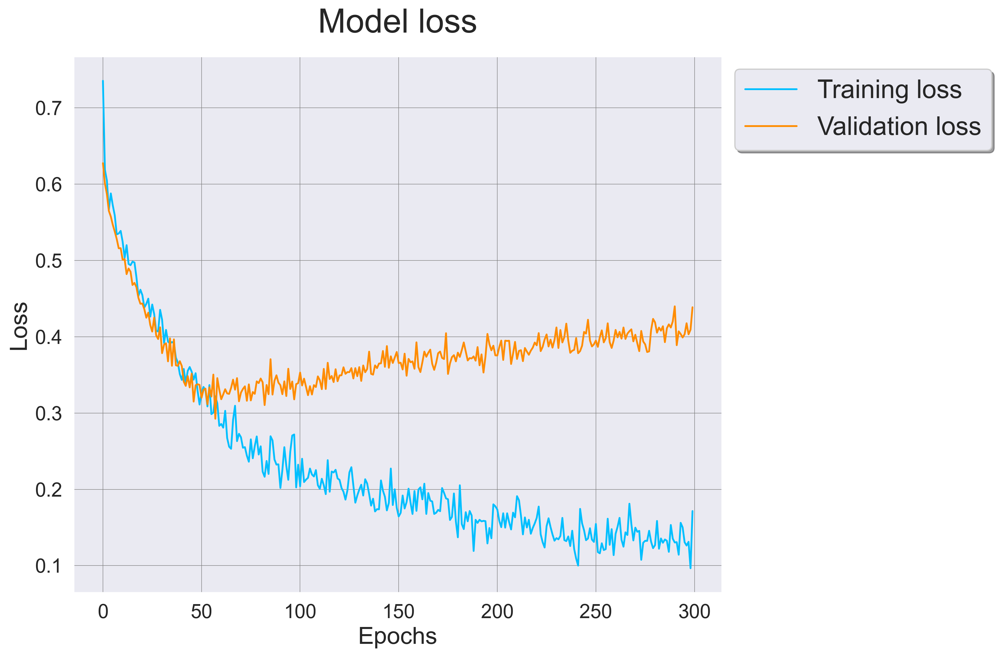

In [84]:
training_loss = history.history['loss']
validation_loss = history.history['val_loss']
epochs = history.epoch

fig = plt.figure(figsize=(12, 8), dpi=300)

plt.plot(epochs, training_loss, label='Training loss', color='deepskyblue')
plt.plot(epochs, validation_loss, label='Validation loss', color='darkorange')

plt.title('Model loss', fontsize=28, pad=20)
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Loss', fontsize=20)

plt.grid(b=True, which="both", axis="both", color="grey", linewidth=0.4)

plt.legend(bbox_to_anchor=(1, 1), loc="upper left", fontsize='large', frameon=True, shadow=True, fancybox=True)

plt.tight_layout()

plt.savefig('figures/neural_network_loss.png', dpi=600, transparent=True)

plt.show()

## Plot Training Accuracy

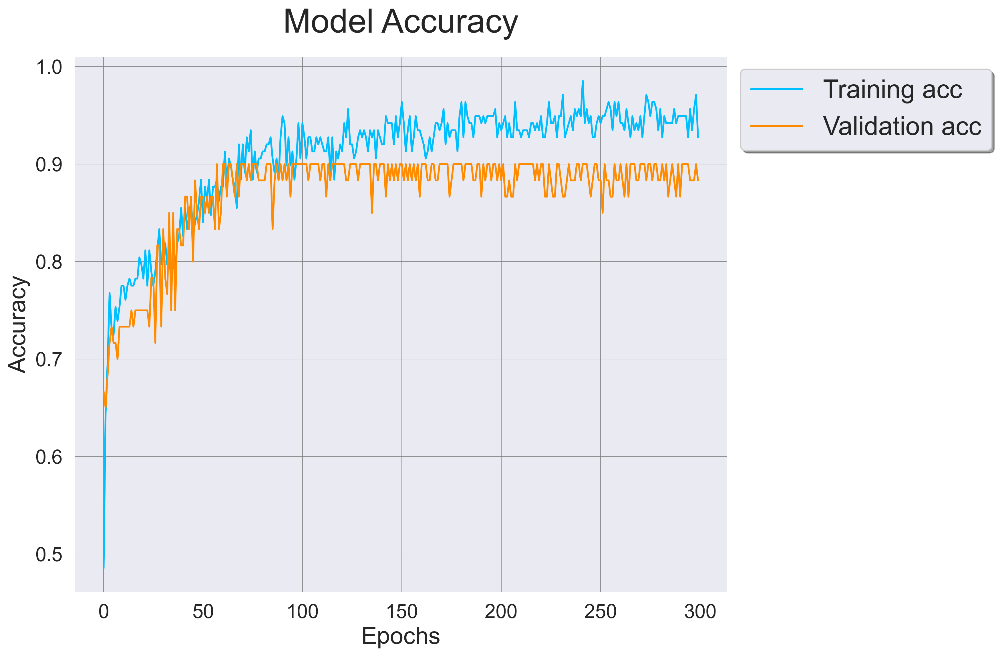

In [85]:
training_accuracy = history.history['accuracy']
validation_loss = history.history['val_accuracy']
epochs = history.epoch


fig = plt.figure(figsize=(12, 8), dpi=300)

plt.plot(epochs, training_accuracy, label='Training acc', color='deepskyblue')
plt.plot(epochs, validation_loss, label='Validation acc', color='darkorange')

plt.title('Model Accuracy', fontsize=28, pad=20)
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)

plt.grid(b=True, which="both", axis="both", color="grey", linewidth=0.4)

plt.legend(bbox_to_anchor=(1, 1), loc="upper left", fontsize='large', frameon=True, shadow=True, fancybox=True)

plt.tight_layout()

plt.savefig('figures/neural_network_accuracy.png', dpi=600, transparent=True)

plt.show()

## Save Training History Data

In [86]:
history_data = pd.DataFrame(history.history)

history_data['epochs'] = history.epoch

history_data.to_csv("csv_tables/neural_network_history.csv", index=False)

history_data.head()

,loss,accuracy,val_loss,val_accuracy,epochs
0,0.735505,0.485507,0.627553,0.666667,0
1,0.618996,0.644928,0.600954,0.650000,1
2,0.604998,0.695652,0.587069,0.683333,2
3,0.566562,0.768116,0.564976,0.716667,3
4,0.587868,0.731884,0.557548,0.733333,4


## Save Neural Net

In [87]:
saved_time = int(time.time())

path = f'./saved_models/{saved_time}'

# Save the model in tf format
lstm_model.save(path, save_format='tf')

INFO:tensorflow:Assets written to: ./saved_models/1619146871\assets


INFO:tensorflow:Assets written to: ./saved_models/1619146871\assets


In [88]:
# Save the model as a single HDF5 file
lstm_model.save('saved_models/hepatitis_mortality.h5')

---

## Make Predictions with the Neural Network

---

### Load Model

In [89]:
loaded_model = tf.keras.models.load_model('saved_models/hepatitis_mortality.h5')

#### Get Column Names of the Data that was Used to Train the Neural Network

In [90]:
list(X_train_new.columns)

['ascites',
 'spiders',
 'malaise',
 'spleen_palpable',
 'sgot',
 'bilirubin',
 'protime',
 'age']

#### Get Data Types of the Data that was Used to Train the Neural Network

In [91]:
X_train_new.dtypes

ascites              int64
spiders              int64
malaise              int64
spleen_palpable      int64
sgot               float64
bilirubin          float64
protime              int64
age                  int64
dtype: object

---

In [92]:
# Input Features
inputs = [
    "Ascites",
    
    'Spiders', 
    
    'Malaise', 
    
    'Spleen Palpable', 
    
    'SGOT', 
    
    'Bilirubin', 
    
    'Protime', 
    
    'Age'
]


# Take inputs
input_data = []

for i in range(len(inputs)):

    print('-------------------------------------')

    answer = float(input(inputs[i] + ": "))
    
    input_data.append(answer)


input_data = np.array([input_data])

# Reshape input data
input_data = np.reshape(
    input_data, 
    (
        input_data.shape[0], 1, 
        input_data.shape[1]
    )
)

# Get prediction
prediction = loaded_model.predict(input_data)


if (prediction < 0.5):
    print('#####################')
    print("DEATH SUSPECTED")
    print(prediction)
    print('#####################')

elif(prediction >= 0.5):
    print('#####################')
    print("YOU WILL SURVIVE")
    print(prediction)
    print('#####################')

-------------------------------------
Ascites: 1
-------------------------------------
Spiders: 0
-------------------------------------
Malaise: 0
-------------------------------------
Spleen Palpable: 1
-------------------------------------
SGOT: 50
-------------------------------------
Bilirubin: 4
-------------------------------------
Protime: 62
-------------------------------------
Age: 36
#####################
YOU WILL SURVIVE
[[0.944862]]
#####################


---

## References

+ **_[\[1\]](https://archive.ics.uci.edu/ml/datasets/hepatitis)_** Dua, D. and Graff, C. (2019). UCI Machine Learning Repository [http://archive.ics.uci.edu/ml]. Irvine, CA: University of California, School of Information and Computer Science.